<a href="https://colab.research.google.com/github/shiksSh/Fire/blob/main/DQN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Algos

## Online Main algo DQN (new scenario)

### Main algo

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import itertools

import math
import random
import matplotlib
from collections import namedtuple, deque
from itertools import count

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as T
from torch._C import dtype

# changing the font size:
# plt.rcParams.update({'font.size': 15})

# Constants used:
TRIALS = 15#100#1000
TRIAL_LEN = 4000#50000#500
BATCH_SIZE = 128#32#
TARGET_UPDATE = 10
INPUT_SHAPE = 4
NUM_ACCESS_POINTS = 9
NEGATIVE_REWARD = -15000
DIAG_DIRECTORY = "torch_diags_10APs/"
# used for cost and migration dictionaries
# LATENCY_MATRIX = [[2.55316, 9.70525, 7.02418],
#                   [9.70525, 2.55389, 6.25835],
#                   [7.02418, 6.26684, 2.55398]]


LATENCY_MATRIX = [[2.55316, 9.70525, 7.02418, 2.50611, 8.97695, 4.81203, 6.93397, 6.21317, 7.60077],
                  [9.70525, 2.55389, 6.25835, 11.8198, 7.18656, 3.92144, 6.99266, 6.2124, 6.71018],
                  [7.02418, 6.26684, 2.55398, 4.02147, 3.27882, 2.77404, 4.02353, 5.07656, 2.77417],
                  [2.50611, 11.8198, 4.02147, 2.55354, 9.28922, 7.44114, 9.19819, 4.21866, 11.8622],
                  [8.97695, 7.18656, 3.27882, 9.28922, 2.55301, 3.26512, 2.0394, 5.5403, 5.58373],
                  [4.75385, 3.92267, 2.77457, 7.44114, 3.26512, 2.55366, 1.58549, 3.0197, 2.78874],
                  [6.91204, 7.6288, 4.2441, 9.19819, 2.0394, 1.58474, 2.55359, 3.95576, 4.37348],
                  [6.21317, 6.2124, 5.31069, 4.21866, 6.59593, 3.06604, 3.95576, 2.55396, 5.85478],
                  [7.60077, 6.71018, 2.77417, 11.8622, 5.55827, 2.78874, 4.37348, 5.85478, 2.55313]]
MIGR_COST = np.zeros((NUM_ACCESS_POINTS, NUM_ACCESS_POINTS))
STORAGE_COST_temp = np.zeros((NUM_ACCESS_POINTS))
for p in range(NUM_ACCESS_POINTS):
  diff = random.uniform(-0.5, 0.5)
  STORAGE_COST_temp[p] = 5+diff
  for q in range(NUM_ACCESS_POINTS):
    diff = random.uniform(-0.5, 0.5)
    MIGR_COST[p][q] = LATENCY_MATRIX[p][q]+diff

COST_DICT = MIGR_COST#np.random.rand(NUM_ACCESS_POINTS,NUM_ACCESS_POINTS)
STORAGE_COST = STORAGE_COST_temp#np.random.rand(NUM_ACCESS_POINTS)

ACTUAL_EPS = 0.01#0.15#
GAMMA = 0.85
#EPSILON = 1.0
#EPSILON_MIN = 0.01
EPSILON_DECAY = 0.9#0.995 #Exploration vs exploitation
EPSILON_THRESHOLD = 30000

LEARNING_RATE = 0.1 # learning rate
TAU = 0.125
#STATE_SHAPE = 1
NO_BACKUP = 100
BACKUP_ACTION=101
USER_ACC_FACTOR=1.5
K_ = 20

# PR_LU_TRANS = np.array([
#     [0.35,0.32,0.33],
#     [0.28,0.38,0.34],
#     [0.32,0.29,0.39]])

PR_LU_TRANS = np.array([
    [0.15,0.05,0.1,0.1,0.08,0.12,0.09,0.11,0.2],
    [0.1,0.08,0.12,0.09,0.11,0.03,0.17,0.15,0.15],
    [0.15,0.11,0.03,0.17,0.05,0.1,0.1,0.08,0.21],
    [0.15,0.05,0.1,0.1,0.11,0.03,0.17,0.08,0.21],
    [0.15,0.05,0.1,0.1,0.08,0.12,0.17,0.09,0.14],
    [0.12,0.09,0.15,0.05,0.1,0.1,0.08,0.11,0.2],
    [0.05,0.1,0.1,0.08,0.12,0.15,0.09,0.11,0.2],
    [0.09,0.11,0.03,0.15,0.05,0.1,0.1,0.08,0.29],
    [0.08,0.15,0.05,0.1,0.1,0.12,0.09,0.11,0.2]])
DELTA = 0.005 # lower bound for estimate epsilon
# # learning rate
# ALPHA = 0.05
# LAMBDA = 0.7 # eligibility decay rate
# # exploration rate
# EPS=0.03#0.9

ALPHA = 0.05#0.005
#ALPHA_T = 0.05
#ALPHA_U = 0.05

#EXPLORATION_FIXED_RATE = 3000

# Calculated:
# states = <Lu,Ls,0/1,backup/not>
NUM_STATES = NUM_ACCESS_POINTS*NUM_ACCESS_POINTS*2*(NUM_ACCESS_POINTS+1)
# actions = <Ls,backup_loc>
NUM_ACTIONS = NUM_ACCESS_POINTS*(NUM_ACCESS_POINTS+1)

INITIAL_STATE = 0
INITIAL_ACTION = random.randint(0,NUM_ACTIONS-1)

# if gpu is to be used
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
Transition = namedtuple('Transition',
                        ('state', 'action', 'next_state', 'reward', 'imp_wt'))

def conv_to_tensor(x):
  return torch.tensor([[x]], device=device, dtype = torch.float32)

class ReplayMemory(object):

    def __init__(self, capacity):
        self.memory = deque([],maxlen=capacity)

    def push(self, *args):
        """Save a transition"""
        s, a, ns, r, iw = args
        # print(type(s), type(a), type(ns), type(r))
        s = conv_to_tensor(s)
        a = torch.tensor([[a]], device=device, dtype = torch.int64)
        ns = conv_to_tensor(ns)
        r = conv_to_tensor(r)
        iw = conv_to_tensor(iw)
        # print("in push",s.size(), type(a), type(ns), type(r))
        self.memory.append(Transition(s, a, ns, r, iw))

    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory)

class DQN(nn.Module):

    def __init__(self, input_dim, output_dim):
        super(DQN, self).__init__()
        #self.linear_relu_stack = nn.Sequential(
        #    nn.Linear(input_dim, 512),
        #    nn.ReLU(),
        #    nn.Linear(512, 512),
        #    nn.ReLU(),
        #    nn.Linear(512, 512),
        #    nn.ReLU(),
        #    nn.Linear(512, output_dim)
        #)
        # self.linear_relu_stack = nn.Sequential(
        #     nn.Linear(input_dim, 12),
        #     nn.ReLU(),
        #     nn.Linear(12, 24),
        #     nn.ReLU(),
        #     nn.Linear(24, 12),
        #     nn.ReLU(),
        #     nn.Linear(12, output_dim)
        # )
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(input_dim, 24),
            nn.ReLU(),
            nn.Linear(24, 48),
            nn.ReLU(),
            nn.Linear(48, 24),
            nn.ReLU(),
            nn.Linear(24, output_dim)
        )

        # self.linear_relu_stack = nn.Sequential(
        #     nn.Linear(input_dim, 96),
        #     nn.ReLU(),
        #     nn.Linear(96, 198),
        #     nn.ReLU(),
        #     nn.Linear(198, 96),
        #     nn.ReLU(),
        #     nn.Linear(96, output_dim)
        # )

    # Called with either one element to determine next action, or a batch
    # during optimization. Returns tensor([[left0exp,right0exp]...]).
    def forward(self, x):
        x = x.to(device)
        return self.linear_relu_stack(x)

n_actions = NUM_ACTIONS

class DQN_wrapper:
    def __init__(self):
        input_dim = INPUT_SHAPE # lu, ls, anomaly/not, backup/not
        output_dim = NUM_ACTIONS
        self.policy_net = DQN(input_dim, output_dim).to(device)
        self.target_net = DQN(input_dim, output_dim).to(device)
        self.target_net.load_state_dict(self.policy_net.state_dict())
        self.target_net.eval()

        self.optimizer = optim.Adam(self.policy_net.parameters(), lr = LEARNING_RATE)
        #self.optimizer = optim.RMSprop(self.policy_net.parameters(), lr = LEARNING_RATE)
        #self.criterion = nn.SmoothL1Loss()
        self.criterion = nn.MSELoss()

        self.memory = ReplayMemory(10000)

        self.steps_done = 0
        self.eps = EPSILON_DECAY
        self.tau = TAU
    
    def select_action(self, state):
        sample = random.random()
        if sample > self.eps:
            with torch.no_grad():
                return torch.argmax(self.policy_net(state)).item()
        else:
            return random.randrange(NUM_ACTIONS)
    
    def get_q_value(self, state):
        with torch.no_grad():
            return torch.max(self.policy_net(state)).item()
    
    def optimize_model(self):
        if len(self.memory) < BATCH_SIZE:
            return
        transitions = self.memory.sample(BATCH_SIZE)
        # Transpose the batch (see https://stackoverflow.com/a/19343/3343043 for
        # detailed explanation). This converts batch-array of Transitions
        # to Transition of batch-arrays.
        batch = Transition(*zip(*transitions))

        # Compute a mask of non-final states and concatenate the batch elements
        # (a final state would've been the one after which simulation ended)
        non_final_mask = torch.tensor(tuple(map(lambda s: s is not None,
                                              batch.next_state)), device=device, dtype=torch.bool)
        non_final_next_states = torch.cat([s for s in batch.next_state
                                                    if s is not None])
        # print("nfm",non_final_mask.size())
        # print("nfns",non_final_next_states.size())
        
        # print("nfns_b4:",non_final_next_states.size())
        non_final_next_states = torch.reshape(non_final_next_states, (BATCH_SIZE, 4))
        # print("nfns_af:",non_final_next_states.size())
        state_batch = torch.cat(batch.state)
        action_batch = torch.cat(batch.action)
        reward_batch = torch.cat(batch.reward)
        imp_wt_batch = torch.cat(batch.imp_wt)
        # print("sb",state_batch.size())
        # print("ab",action_batch.size())
        # print("rb",reward_batch.size())
        # Compute Q(s_t, a) - the model computes Q(s_t), then we select the
        # columns of actions taken. These are the actions which would've been taken
        # for each batch state according to policy_net
        # print("non_final_mask: ", non_final_mask.size())
        # print("non_final_next_states: ", non_final_next_states.size())
        # Find predictions
        state_action_values = self.policy_net(state_batch)

        # print("sav_b4:",state_action_values.size())
        state_action_values = torch.reshape(state_action_values, (BATCH_SIZE, NUM_ACTIONS))
        # print("sav_af:",state_action_values.size())
        # Now, predictions are for 6 actions, pick out the value which is for the current action
        state_action_values = state_action_values.gather(1, action_batch)
        # print("action_batch: ", state_action_values.size())
        # Compute V(s_{t+1}) for all next states.
        # Expected values of actions for non_final_next_states are computed based
        # on the "older" target_net; selecting their best reward with max(1)[0].
        # This is merged based on the mask, such that we'll have either the expected
        # state value or 0 in case the state was final.
        next_state_values = torch.zeros(BATCH_SIZE, device=device)
        # print("sav",next_state_values.size())
        next_state_values[non_final_mask] = self.target_net(non_final_next_states).max(1)[0].detach()
        
        # Compute the expected Q values
        expected_state_action_values = (next_state_values * GAMMA).reshape((BATCH_SIZE,1))#( + reward_batch)*imp_wt_batch
        # print("=====**********EXP1=====", expected_state_action_values.size(), "=====**********EXP1=====",reward_batch.size())
        expected_state_action_values = (expected_state_action_values + reward_batch)
        # print("=====**********EXP2=====", expected_state_action_values.size())
        expected_state_action_values = (expected_state_action_values)*imp_wt_batch
        # print("=====**********EXP3=====", expected_state_action_values.size())
        # print("=====**********EXP4=====", expected_state_action_values.unsqueeze(1).size())
        expected_state_action_values = expected_state_action_values.reshape((BATCH_SIZE,1))
        
        # Compute Huber loss
        #print(state_action_values.size(), "-------", expected_state_action_values.size())#unsqueeze(1).size())
        loss = self.criterion(state_action_values, expected_state_action_values)#.unsqueeze(1))
        
        # print("=====LOSS=====", loss)
        # print("=====NonFinal=====", non_final_next_states)
        # print("=====NonFinnextSt=====", self.target_net(non_final_next_states))
        # print("=====NSV=====", next_state_values)
        # print("=====NSV.size=====", next_state_values.size())
        # print("=====IMP_WT=====", imp_wt_batch)
        # print("=====EXP=====", expected_state_action_values.unsqueeze(1))
        # print("=====EXP-size=====", expected_state_action_values.unsqueeze(1).size())
        # print("=====ST-Act-size=====", state_action_values.size())
        # print("=====REW=====", reward_batch)
        # print("=====ACT=====", action_batch)
        # print("=====ST-Batch=====", state_batch)
        # Optimize the model
        self.optimizer.zero_grad()
        loss.backward()
        for param in self.policy_net.parameters():
            param.grad.data.clamp_(-1, 1)
        self.optimizer.step()

    def train_target_pytorch(self):
        self.target_net.load_state_dict(self.policy_net.state_dict())
    def save_model(self, name):
        name = "./"+name
        torch.save(self.policy_net.state_dict(), name)

# Utility function:
def state_transformation(state):
    APlist=list(range(0,NUM_ACCESS_POINTS))
    #create dictionary of states
    StatesDict=list(itertools.product(APlist,APlist))
    actions = list(range( NUM_ACCESS_POINTS))
    actions.append(NO_BACKUP)
    somelists = [
      list(range( NUM_ACCESS_POINTS)),#[0,1, 2],
      list(range( NUM_ACCESS_POINTS)),#[0,1,2],
      [0,1],
      actions#[0,NO_BACKUP] # 'n' refers to no backup.
    ]
    stateList0=np.zeros((NUM_STATES,4))
    a=0
    for element in itertools.product(*somelists):
        stateList0[a,:]=element
        # if stateList0[a,2]==1:
        #     self.rsList.append(a)
        a=a+1
    # self.stateList=stateList0
    st = stateList0[state]
    t = torch.tensor(st, dtype=torch.float32)
    # print("torch t:", t)
    return t

def state_transformation2(state):
    APlist=list(range(0,NUM_ACCESS_POINTS))
    #create dictionary of states
    StatesDict=list(itertools.product(APlist,APlist))
    actions = list(range( NUM_ACCESS_POINTS))
    actions.append(NO_BACKUP)
    somelists = [
      list(range( NUM_ACCESS_POINTS)),#[0,1, 2],
      list(range( NUM_ACCESS_POINTS)),#[0,1,2],
      [0,1],
      actions#[0,NO_BACKUP] # 'n' refers to no backup.
    ]
    stateList0=np.zeros((NUM_STATES,4))
    a=0
    for element in itertools.product(*somelists):
        stateList0[a,:]=element
        # if stateList0[a,2]==1:
        #     self.rsList.append(a)
        a=a+1
    # self.stateList=stateList0
    st = stateList0[state]
    # t = torch.tensor(st, dtype=torch.float32)
    # print("torch t:", t)
    return st

class RLalgo:

    def __init__(self, alpha = ALPHA):
        self.gamma = 0.9
        self.trials  = TRIALS
        self.trial_len = TRIAL_LEN
        self.totalTS=self.trials*self.trial_len
        self.dqn_agent=DQN_wrapper()
        # env details!!
        self.numAP=NUM_ACCESS_POINTS
        self.numActions=NUM_ACTIONS
        self.numStates=NUM_STATES
        self.noBackup=NO_BACKUP
        self.delta=DELTA # bounds for estimate epsilon.
        self.userAccFactor=USER_ACC_FACTOR
        self.K = K_
        self.create_dicts()
        self.create_mappings()
        self.alpha = alpha # learning rate
        self.alphaT = alpha#ALPHA_T
        self.alphaU = alpha#ALPHA_U

        self.prev_backup_loc = self.noBackup

    def create_dicts(self):
        self.pr_lu_trans=PR_LU_TRANS

        self.QEst=np.zeros((self.numStates,self.numActions, self.trials))

        self.anomalySamplingDist=np.zeros((self.numStates,self.totalTS+1))
        self.anomalySamplingDist[:,0]=0.5
        self.actualEPS=ACTUAL_EPS
        self.actualEps=self.actualEPS*np.ones((self.numStates))
        self.U_normal=np.zeros((self.numStates,self.totalTS+1))
        self.T_anomaly=np.zeros((self.numStates,self.totalTS+1))

        self.migrationCost = COST_DICT
        self.commDelay= COST_DICT
        self.storageCost = STORAGE_COST

        self.Reward=np.zeros((self.totalTS+1))
        self.runningAvg=np.zeros((self.totalTS+1))
        self.TDerror=np.zeros((self.totalTS+1))
        self.importanceWeight=np.zeros((self.numStates,self.totalTS+1))
        self.countT=np.zeros((self.numStates))
        self.countNotT=np.zeros((self.numStates))

        self.countState=np.zeros((self.numStates))
        self.whichState=np.zeros((self.totalTS+1))

        self.est11=np.zeros((self.totalTS+1))
        self.steps = []
        self.cur_state=random.randrange(0,self.numStates)
        
    def create_mappings(self):
        self.rsList=[]
        
        APlist=list(range(0,self.numAP))
        #create dictionary of states
        StatesDict=list(itertools.product(APlist,APlist))
        actions = list(range( NUM_ACCESS_POINTS))
        actions.append(NO_BACKUP)
        somelists = [
          list(range( NUM_ACCESS_POINTS)),#[0,1, 2],
          list(range( NUM_ACCESS_POINTS)),#[0,1,2],
          [0,1],
          actions#[0,self.noBackup] # 'n' refers to no backup.
        ]
        stateList0=np.zeros((self.numStates,4))
        a=0
        for element in itertools.product(*somelists):
            stateList0[a,:]=element
            if stateList0[a,2]==1:
                self.rsList.append(a)
            a=a+1
        self.stateList=stateList0
        
        self.backup0=101
        actlists = [
            list(range( NUM_ACCESS_POINTS)),#[0,1, 2],
            actions#[self.backup0,self.noBackup]
        ]
        self.actList0=np.zeros((self.numActions,2))
        a=0
        b=0
        for element in itertools.product(*actlists):
            self.actList0[a,:]=element
            a=a+1
        print(self.actList0)    
    def env(self, cur_state, action, t):
        self.whichState[t]=cur_state
        self.countState[cur_state]+=1
        prevUserLoc=int(self.stateList[cur_state][0])
        prevSvcLoc=int(self.stateList[cur_state][1])
        newSvcLoc=self.actList0[action][0]
        backupLoc=self.noBackup # initialization
        storCost=0
        if self.actList0[action][1]!=self.noBackup:
            backupLoc=int(self.actList0[action][1])
            storCost=self.storageCost[backupLoc]
        newUserLoc=np.random.choice(np.arange(0,self.numAP), 1, replace=False, p=self.pr_lu_trans[prevUserLoc,:])
        # self.eligibility[cur_state,action,t]=eligibility[cur_state,action,t]+1
        
        #if random number is smaller than the sampling prob, rare event has occured
        if random.random()< self.anomalySamplingDist[cur_state,t]:
            failureLoc= self.actList0[action][0]
            # check if there is backup
            if backupLoc==self.noBackup:
                self.Reward[t]=NEGATIVE_REWARD-self.migrationCost[prevSvcLoc,int(newSvcLoc)]
            else:
                backup_migration_cost = 0
                if self.prev_backup_loc != self.noBackup and backupLoc!=self.noBackup and self.prev_backup_loc != backupLoc:#second condition is true for else block
                    backup_migration_cost = self.migrationCost[self.prev_backup_loc,backupLoc]
                if backupLoc==failureLoc: # we dont want this to happen.
                    self.Reward[t]= NEGATIVE_REWARD-self.migrationCost[prevSvcLoc,int(newSvcLoc)]-storCost-backup_migration_cost   
                else:
                    self.Reward[t]=-self.commDelay[newUserLoc,backupLoc]-self.migrationCost[prevSvcLoc,int(newSvcLoc)]-storCost-backup_migration_cost

            stateName=np.array([newUserLoc,int(newSvcLoc),1,backupLoc])
            new_state=np.where(np.all(self.stateList==stateName,axis=1))[0][0]
    
            #d) compute importance sampling weight.
            
            self.importanceWeight[cur_state,t]=1.0*self.actualEps[cur_state]/self.anomalySamplingDist[cur_state,t]
            # print("+++++impWt+++++", str(self.importanceWeight[cur_state,t]))
            self.countT[cur_state]+=1
        else: # no rare event has occured.
            backup_migration_cost = 0
            if self.prev_backup_loc != self.noBackup and backupLoc!=self.noBackup and self.prev_backup_loc != backupLoc:#second condition is true for else block
                backup_migration_cost = self.migrationCost[self.prev_backup_loc,backupLoc]
            MigrationCost=self.migrationCost[prevSvcLoc,int(newSvcLoc)]
            CommDelayCost=self.commDelay[newUserLoc,int(newSvcLoc)]
            
            self.Reward[t]=(-MigrationCost-CommDelayCost)-storCost - backup_migration_cost
        
            stateName=np.array([newUserLoc,int(newSvcLoc),0,backupLoc])
        
            
            new_state=np.where(np.all(self.stateList==stateName,axis=1))[0][0]
        
            # compute importance sampling weight.
            self.importanceWeight[cur_state,t]=1.0*(1-self.actualEps[cur_state])/(1-self.anomalySamplingDist[cur_state,t])
            # print("+++++impWt+++++", str(self.importanceWeight[cur_state,t]))
            self.countNotT[cur_state]+=1
        self.prev_backup_loc = backupLoc
        return new_state

    def run_algo(self):
        t=0
        cur_state = INITIAL_STATE 
        for trial in range(self.trials):
            cur_state = INITIAL_STATE 
            print("=======",trial,"=======")
            for step in range(self.trial_len):
                # print("==S=T=E=P==",step,"=======")
                action = self.dqn_agent.select_action(state_transformation(cur_state))
                new_state = self.env(cur_state, action, t)
                
                if t>EPSILON_THRESHOLD:
                    self.dqn_agent.eps=max(self.dqn_agent.eps-0.00005,0.01)
                
                for s in range(0,self.numStates):
                    self.T_anomaly[s,t+1]=self.T_anomaly[s,t]
                    self.U_normal[s,t+1]=self.U_normal[s,t]
                
                # # g) update T and U.
                if new_state in self.rsList:
                    Q_est_temp = max(self.dqn_agent.policy_net(state_transformation(new_state))).item()
                    # print(Q_est_temp)
                    self.T_anomaly[cur_state,t+1]=(1-self.alphaT)*self.T_anomaly[cur_state,t]+self.alphaT*self.actualEps[cur_state]*(self.Reward[t] +self.gamma*Q_est_temp)
                else:
                    Q_est_temp = max(self.dqn_agent.policy_net(state_transformation(new_state))).item()
                    # print(Q_est_temp)
                    self.U_normal[cur_state,t+1]=(1-self.alphaU)*self.U_normal[cur_state,t]+self.alphaU*(1-self.actualEps[cur_state])*(self.Reward[t] +self.gamma*Q_est_temp)
                
                # # h) update rare event probs
                # #print('T', T_anomaly[state,t+1], 'U',U_normal[state,t+1] )
                est1=abs(self.T_anomaly[cur_state,t+1])/(abs(self.T_anomaly[cur_state,t+1])+abs(self.U_normal[cur_state,t+1]))
                # #print('t', abs(T_anomaly[state,t+1]))
                # #print('u',abs(U_normal[state,t+1]))
                self.est11[t]=est1
                for s in range(0,self.numStates):
                    self.anomalySamplingDist[s,t+1]=self.anomalySamplingDist[s,t]
                self.anomalySamplingDist[cur_state,t+1]=min(max(self.delta,est1),1-self.delta)
                # #print(anomalySamplingDist[state,t+1])

                if trial > 15 and self.Reward[t]<-600:
                    print("----------", self.stateList[cur_state], "----------", self.actList0[action])


                self.dqn_agent.memory.push(state_transformation2(cur_state), action, state_transformation2(new_state), self.Reward[t], self.importanceWeight[cur_state,t])
                self.dqn_agent.optimize_model()
                t=t+1
                cur_state = new_state
                if t>=1:
                    if t<self.K:
                        self.runningAvg[t]=np.average(self.Reward[0:t])
                    else:
                        self.runningAvg[t]=np.average(self.Reward[t-self.K:t])
 
            # out of step, inside trials
            if trial % TARGET_UPDATE == 0:
                self.dqn_agent.train_target_pytorch()#self.dqn_agent.target_net.load_state_dict(self.dqn_agent.policy_net.state_dict())
            for s in range(0,self.numStates):
                s_Temp = state_transformation(s)
                pred = self.dqn_agent.policy_net(s_Temp)
                for a in range(0,self.numActions):
                    if s in [0,1,2,3,4]:
                      print("State: ", str(s), "-----Actions: " , str(a), "-----Pred: ", pred[a])
                    self.QEst[s,a,trial] = pred[a]
            
            # if step >= 199:
            #     print("Failed to complete in trial {}".format(trial))
            #     if step % 10 == 0:
            #         self.dqn_agent.save_model("trial-{}.model".format(trial))
            # else:
            #     print("Completed in {} trials".format(trial))
            #     self.dqn_agent.save_model("success.model")
            #     break
                 
        plt.plot(self.Reward,'.')
        plt.ylabel('Reward',fontsize=15)
        plt.xlabel('No. of Iterations, x10^3',fontsize=15)
        plt.xticks([10000,20000,30000,40000,50000,60000,70000,80000],['10','20','30','40','50', '60', '70', '80'])
        plt.show()
        # name = DIAG_DIRECTORY + "Reward.jpg"
        # plt.savefig(name)
        # plt.clf()

        #print('avg reward across time', np.mean(Reward))

        plt.plot(self.runningAvg)
        plt.ylabel('Reward, Running Average')
        plt.xlabel('No. of Iterations, 10^3')
        plt.xticks([1000, 5000, 10000, 15000, 20000, 25000, 30000, 35000, 40000, 45000, 50000, 55000, 60000],['1', '5', '10', '15', '20', '25', '30', '35', '40', '45', '50', '55', '60'])
        plt.show()
        # name = DIAG_DIRECTORY + "RunningAvg.jpg"
        # plt.savefig(name)
        # plt.clf() 
        
        # for s in range(0,self.numStates):
        #     if s not in [0,1,2,5,6,8,10,12,16]:
        #         continue
        #     for a in range(0,self.numActions ):
                
        #         plt.plot(self.QEst[s,a,:])
        #         name='Q Est, State {}, act {}'.format(s,a)
        #         plt.ylabel(name)
        #         plt.xlabel('Time')
        #         plt.show()
        #         # name = DIAG_DIRECTORY + "State_"+str(s)+"Action_"+str(a)+".jpg"
        #         # plt.savefig(name)
        #         # plt.clf()   
        #         # plt.plot(np.arange(self.trials-1,self.trials), self.QEst[s,a,self.trials-1:self.trials])
        #         # name='Q Est, State {}, act {} lastPart'.format(s,a)
        #         # plt.ylabel(name)
        #         # plt.xlabel('Time')
        #         # plt.show()
        #     # plt.plot(anomalySamplingDist[8,:],'.') 
        #     # plt.show()


        #     # for i in range(0,self.numActions ):
        #         #print(i, ValueEst[i,190000:200000])
        #     plt.plot(self.anomalySamplingDist[s,:],'.') 
        #     name='anomalySampDist, state{}'.format(s)
        #     plt.ylabel(name)
        #     plt.show()
        #     # name = DIAG_DIRECTORY + "AnomalySD_State_"+str(s)+".jpg"
        #     # plt.savefig(name)
        #     # plt.clf()

        #     plt.plot(self.importanceWeight[s,:],'.') 
        #     name='imp_wt, state{}'.format(s)
        #     plt.ylabel(name)
        #     plt.show()
        #     # name = DIAG_DIRECTORY + "ImpWt_State_"+str(s)+".jpg"
        #     # plt.savefig(name)
        #     # plt.clf()

        #     plt.plot(self.T_anomaly[s,:],'.') 
        #     name='T-anomaly, state{}'.format(s)
        #     plt.ylabel(name)
        #     plt.show()
        #     # name = DIAG_DIRECTORY + "TAnomaly_State_"+str(s)+".jpg"
        #     # plt.savefig(name)
        #     # plt.clf()

        #     plt.plot(self.U_normal[s,:],'.') 
        #     name='U-normal, state{}'.format(s)
        #     plt.ylabel(name)
        #     plt.show()
        #     # name = DIAG_DIRECTORY + "UNorm_State_"+str(s)+".jpg"
        #     # plt.savefig(name)
        #     # plt.clf()



cuda


### Running

[[  0.   0.]
 [  0.   1.]
 [  0.   2.]
 [  0.   3.]
 [  0.   4.]
 [  0.   5.]
 [  0.   6.]
 [  0.   7.]
 [  0.   8.]
 [  0. 100.]
 [  1.   0.]
 [  1.   1.]
 [  1.   2.]
 [  1.   3.]
 [  1.   4.]
 [  1.   5.]
 [  1.   6.]
 [  1.   7.]
 [  1.   8.]
 [  1. 100.]
 [  2.   0.]
 [  2.   1.]
 [  2.   2.]
 [  2.   3.]
 [  2.   4.]
 [  2.   5.]
 [  2.   6.]
 [  2.   7.]
 [  2.   8.]
 [  2. 100.]
 [  3.   0.]
 [  3.   1.]
 [  3.   2.]
 [  3.   3.]
 [  3.   4.]
 [  3.   5.]
 [  3.   6.]
 [  3.   7.]
 [  3.   8.]
 [  3. 100.]
 [  4.   0.]
 [  4.   1.]
 [  4.   2.]
 [  4.   3.]
 [  4.   4.]
 [  4.   5.]
 [  4.   6.]
 [  4.   7.]
 [  4.   8.]
 [  4. 100.]
 [  5.   0.]
 [  5.   1.]
 [  5.   2.]
 [  5.   3.]
 [  5.   4.]
 [  5.   5.]
 [  5.   6.]
 [  5.   7.]
 [  5.   8.]
 [  5. 100.]
 [  6.   0.]
 [  6.   1.]
 [  6.   2.]
 [  6.   3.]
 [  6.   4.]
 [  6.   5.]
 [  6.   6.]
 [  6.   7.]
 [  6.   8.]
 [  6. 100.]
 [  7.   0.]
 [  7.   1.]
 [  7.   2.]
 [  7.   3.]
 [  7.   4.]
 [  7.   5.]
 [  7.   6.]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:500: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:117: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:483: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


Streaming output truncated to the last 5000 lines.
State:  4 -----Actions:  51 -----Pred:  tensor(-9.1161, device='cuda:0', grad_fn=<SelectBackward0>)
State:  4 -----Actions:  52 -----Pred:  tensor(-9.5208, device='cuda:0', grad_fn=<SelectBackward0>)
State:  4 -----Actions:  53 -----Pred:  tensor(-11.7729, device='cuda:0', grad_fn=<SelectBackward0>)
State:  4 -----Actions:  54 -----Pred:  tensor(-10.1369, device='cuda:0', grad_fn=<SelectBackward0>)
State:  4 -----Actions:  55 -----Pred:  tensor(-88.6481, device='cuda:0', grad_fn=<SelectBackward0>)
State:  4 -----Actions:  56 -----Pred:  tensor(-9.3228, device='cuda:0', grad_fn=<SelectBackward0>)
State:  4 -----Actions:  57 -----Pred:  tensor(-10.3697, device='cuda:0', grad_fn=<SelectBackward0>)
State:  4 -----Actions:  58 -----Pred:  tensor(-9.8899, device='cuda:0', grad_fn=<SelectBackward0>)
State:  4 -----Actions:  59 -----Pred:  tensor(-84.3112, device='cuda:0', grad_fn=<SelectBackward0>)
State:  4 -----Actions:  60 -----Pred:  tens

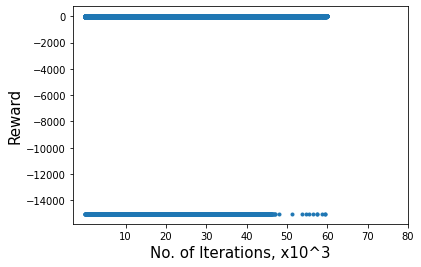

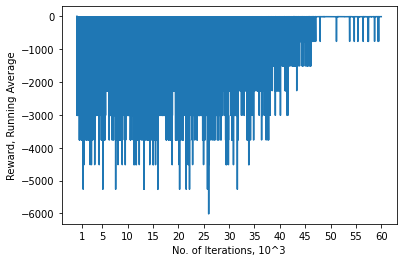

In [ ]:
obj = RLalgo()
obj.run_algo()

### Plot Reward

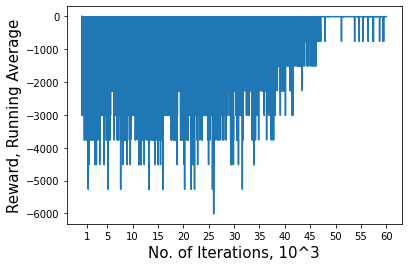

In [ ]:
plt.plot(obj.runningAvg)
plt.ylabel('Reward, Running Average',fontsize=15)#
plt.xlabel('No. of Iterations, 10^3',fontsize=15)#
plt.xticks([1000, 5000, 10000, 15000, 20000, 25000, 30000, 35000, 40000, 45000, 50000, 55000, 60000],['1', '5', '10', '15', '20', '25', '30', '35', '40', '45', '50', '55', '60'])
plt.show()

### Online

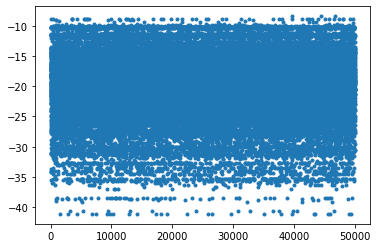

avg reward across time -19.6423415391295


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

mean NS reward -19.65400431708351
 mean NS migration -8.838314158366172
 mean NS delay -5.815690158717338
 mean NS storage -5.0


<Figure size 432x288 with 0 Axes>

mean RE reward -18.434048464153836
 mean RE migration -8.447887773777266
 mean RE delay -4.986160690376569
 mean RE storage -5.0


In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Tue Aug  9 18:06:18 2022

@author: Marie
"""
from scipy.special import softmax


# no eligibility traces

import numpy as np
import itertools

import random
import matplotlib.pyplot as plt
from sklearn.preprocessing import normalize
from statistics import mean

#np.random.seed(4)
#random.seed(3)

# Q_ourAlgo =np.load('Q_ourAlgo.npy')
# Q_BL1= np.load('Q_BL1_c.npy')
Q_ourAlgo = obj.QEst[:, :, TRIALS-1]
policy0=Q_ourAlgo#Q_BL1

NEGATIVE_REWARD = -15000
totalTS=50000
gamma=0.85 #discount factor
# alpha=0.05 # learning rate
# #deltaAlpha=0.0001 #adjustment rate for alpha
# alphaT=0.05
# alphaU=0.05

actualEPS=0.01

delta=0.005 # bounds for estimate epsilon.
lambda_=0.7 #eligibility decay rate
eps=0.9 #exploration rate
K=20

numAP=9
#numAnomalyAP=1
numActions=numAP*(1+numAP)
APlist=list(range(0,numAP))
#create dictionary of states
StatesDict=list(itertools.product(APlist,APlist))

numStates=(numAP)*(numAP)*2*(1+numAP)
noBackup=100
StatesDict=list(itertools.product(APlist,APlist))
actions = list(range( NUM_ACCESS_POINTS))
actions.append(NO_BACKUP)
somelists = [
  list(range( numAP)),#[0,1, 2],
  list(range( numAP)),#[0,1,2],
  [0,1],
  actions#[0,self.noBackup] # 'n' refers to no backup.
]

DIAG_DIRECTORY = 'diags/'
rsList=[]

stateList0=np.zeros((numStates,4))
a=0
for element in itertools.product(*somelists):

    #elem=np.array(element)
    #print(elem)
    stateList0[a,:]=element
    if stateList0[a,2]==1:
        rsList.append(a)
    a=a+1
#stateList=stateList0

backup0=101

actlists = [
    list(range( numAP)),
    actions
]
actList0=np.zeros((numActions,2))
# actList2=np.zeros((numAP*2,2)) # list of actions if there's currently no backup in system

a=0
b=0
for element in itertools.product(*actlists):
    actList0[a,:]=element
    # if actList0[a,1]!=remain:
    #     actList2[b,:]=actList0[a,:]
    #     b=b+1
    a=a+1
    
policy=np.zeros((numStates,numActions))
for n in range(0,numStates):
    policy[n,:]=softmax(policy0[n,:])
    


#edit this later. should be a function of number of BS.
numAnomalyStates=numAP*numAP #EDIT this later.
numNormalStates=numStates-numAnomalyStates

# # ENVIRONMENT
# # g(s'|s): transition prob from all states to anomaly
# g_ss=np.random.rand(numAP,numAnomalyAP) # l_svc stays the same.
# #sum_of_rows = g_ss.sum(axis=1)
# #g_dist=g_ss / sum_of_rows[:, np.newaxis]
# g_dist=normalize(g_ss,axis=1, norm='l1')

#lu_trans=np.random.rand(numAP,numAP-numAnomalyAP)  
#pr_lu_trans=normalize(lu_trans,axis=1, norm='l1')
# pr_lu_trans=np.array([[0.5,0.5,0], [0.15,0.1,0.75], [0.2,0.4,0.4]])
pr_lu_trans=np.array([
    [0.15,0.05,0.1,0.1,0.08,0.12,0.09,0.11,0.2],
    [0.1,0.08,0.12,0.09,0.11,0.03,0.17,0.15,0.15],
    [0.15,0.11,0.03,0.17,0.05,0.1,0.1,0.08,0.21],
    [0.15,0.05,0.1,0.1,0.11,0.03,0.17,0.08,0.21],
    [0.15,0.05,0.1,0.1,0.08,0.12,0.17,0.09,0.14],
    [0.12,0.09,0.15,0.05,0.1,0.1,0.08,0.11,0.2],
    [0.05,0.1,0.1,0.08,0.12,0.15,0.09,0.11,0.2],
    [0.09,0.11,0.03,0.15,0.05,0.1,0.1,0.08,0.29],
    [0.08,0.15,0.05,0.1,0.1,0.12,0.09,0.11,0.2]])


#ValueEst=np.zeros((totalNStates,totalTS+1))
# QEst=np.zeros((numStates,numActions, totalTS+1))
# QEst[:,:,0]=random.random()*np.ones((numStates,numActions))
#note, we are initialising all to be the same

# anomalySamplingDist=np.zeros((numStates,totalTS+1))
# anomalySamplingDist[:,0]=0.5
#actualEps=delta*np.ones((totalNStates))
actualEps=actualEPS*np.ones((numStates))

# U_normal=np.zeros((numStates,totalTS+1))
# T_anomaly=np.zeros((numStates,totalTS+1))
# eligibility=np.zeros((numStates,numActions,totalTS+1))


#pi(s,a)
#policy=np.random.rand(numStates,numActions)

# reward function:
#migrationCost=10*np.random.rand(numAP,numAP)
LATENCY_MATRIX = [[2.55316, 9.70525, 7.02418, 2.50611, 8.97695, 4.81203, 6.93397, 6.21317, 7.60077],
                  [9.70525, 2.55389, 6.25835, 11.8198, 7.18656, 3.92144, 6.99266, 6.2124, 6.71018],
                  [7.02418, 6.26684, 2.55398, 4.02147, 3.27882, 2.77404, 4.02353, 5.07656, 2.77417],
                  [2.50611, 11.8198, 4.02147, 2.55354, 9.28922, 7.44114, 9.19819, 4.21866, 11.8622],
                  [8.97695, 7.18656, 3.27882, 9.28922, 2.55301, 3.26512, 2.0394, 5.5403, 5.58373],
                  [4.75385, 3.92267, 2.77457, 7.44114, 3.26512, 2.55366, 1.58549, 3.0197, 2.78874],
                  [6.91204, 7.6288, 4.2441, 9.19819, 2.0394, 1.58474, 2.55359, 3.95576, 4.37348],
                  [6.21317, 6.2124, 5.31069, 4.21866, 6.59593, 3.06604, 3.95576, 2.55396, 5.85478],
                  [7.60077, 6.71018, 2.77417, 11.8622, 5.55827, 2.78874, 4.37348, 5.85478, 2.55313]]
MIGR_COST = np.zeros((numAP, numAP))
STORAGE_COST_temp = np.zeros((numAP))
for p in range(numAP):
  diff = random.uniform(-0.5, 0.5)
  STORAGE_COST_temp[p] = 5+diff
  for q in range(numAP):
    diff = random.uniform(-0.5, 0.5)
    MIGR_COST[p][q] = LATENCY_MATRIX[p][q]+diff


commDelay=LATENCY_MATRIX#np.array([[2.55316,9.70525, 7.02418], [9.70525, 2.55389,6.25835], [7.02418,6.26684,2.55398]])
migrationCost=MIGR_COST#np.zeros((numAP,numAP))
# for b in range(numAP):
#     for c in range(numAP):
        
#         diff=random.uniform(-0.5,0.5)
#         migrationCost[b,c]=commDelay[b,c]+diff
#         if b==c:
#             migrationCost[b,c]=0
        
#commDelay=0.5*commDelay
#migrationCost=0.5*migrationCost
userAccFactor=1.5
#the further the dist btwn the two AP, the higher the migration cost
# and the higher the comm delay

storageCost=5*np.ones((numAP)) #5*np.random.rand(numAP)

Reward=np.zeros((totalTS))
runningAvg=np.zeros((totalTS))

# initial state
state=random.randrange(0,numStates)
prevSvcLoc=stateList0[state][1]
#action=random.randint(0,numActions-1)
action=np.random.choice(np.arange(0,numActions), 1, replace=False, p=policy[state,:])[0]
Action=np.zeros((totalTS+1))
Action[0]=action #initialising
storCost=0
backupLoc=noBackup
if actList0[action][1]!=noBackup:
    backupLoc=int(actList0[action][1])
    storCost=storageCost[backupLoc]
newSvcLoc=actList0[action][0]
prev_backup_loc = noBackup

# TDerror=np.zeros((totalTS))
# importanceWeight=np.zeros((numStates,totalTS))
countT=np.zeros((numStates))
countNotT=np.zeros((numStates))

countState=np.zeros((numStates))
whichState=np.zeros((totalTS))

# est11=np.zeros((totalTS))

# AStar_tracker=np.zeros((totalTS))

REreward=[]
REmigration=[]
REdelay=[]
REstorage=[]

NSreward=[]
NSmigration=[]
NSdelay=[]
NSstorage=[]

for t in range(0,totalTS):
    
    # if t>30000:
    #     alpha=max(alpha-0.00005,0.005)
    #     alphaT=alpha
    #     alphaU=alpha
    whichState[t]=state
    countState[state]+=1
    prevUserLoc=int(stateList0[state][0])
    prevSvcLoc=int(stateList0[state][1])
    

    # c) go through environment.
    newUserLoc=np.random.choice(np.arange(0,numAP), 1, replace=False, p=pr_lu_trans[prevUserLoc,:])[0]

    
    #eligibility[state,action,t]=eligibility[state,action,t]+1
    
    
    #if random number is smaller than the sampling prob, rare event has occured
    if random.random()< actualEps[state]: #anomalySamplingDist[state,t]:
        failureLoc= actList0[action][0]
        # check if there is backup
        backup_migration_cost = 0
        if backupLoc==noBackup:
            print("NO BACKUP: State: ", stateList0[state], "\t Action: ", actList0[action])
            Reward[t]=NEGATIVE_REWARD-migrationCost[prevSvcLoc,int(newSvcLoc)]
            REstorage.append(0)
        else:
            #Reward[t]=-2000
            #Reward[t]=-userAccFactor*migrationCost[newUserLoc,backupLoc]-storCost
            if prev_backup_loc != noBackup and backupLoc!=noBackup and prev_backup_loc != backupLoc:#second condition is true for else block
                backup_migration_cost = migrationCost[prev_backup_loc,backupLoc]
            if backupLoc==failureLoc: # we dont want this to happen.
                print("BACKUP==FAILURE: State: ", stateList0[state], "\t Action: ", actList0[action])
                Reward[t]= NEGATIVE_REWARD-migrationCost[prevSvcLoc,int(newSvcLoc)]-storCost-backup_migration_cost
                REstorage.append(-storCost)
            else:
                Reward[t]=-commDelay[newUserLoc][backupLoc]-migrationCost[prevSvcLoc][int(newSvcLoc)]-storCost-backup_migration_cost
                REstorage.append(-storCost)
                dela=-commDelay[newUserLoc][backupLoc]
                REdelay.append(dela)
        REreward.append(Reward[t])
        migr=-migrationCost[prevSvcLoc][int(newSvcLoc)]-backup_migration_cost
        REmigration.append(migr)
        
        
        stateName=np.array([newUserLoc,int(newSvcLoc),1,backupLoc])
        nextState=np.where(np.all(stateList0==stateName,axis=1))[0][0]

        # #d) compute importance sampling weight.
        # #if StatesDict[nextState] in AnomalyDict:
        # importanceWeight[state,t]=actualEps[state]/anomalySamplingDist[state,t]
        # #print('importance',importanceWeight[state])
        countT[state]+=1
        
        
        
    else: # no rare event has occured.
        backup_migration_cost = 0
        if prev_backup_loc != noBackup and backupLoc!=noBackup and prev_backup_loc != backupLoc:#second condition is true for else block
            backup_migration_cost = migrationCost[prev_backup_loc][backupLoc]
        MigrationCost=migrationCost[prevSvcLoc][int(newSvcLoc)]+backup_migration_cost
        #print(MigrationCost)
        #userLoc= stateList[state][0]
        # print("new user loc: ", newUserLoc, "+++++++++++++++++++++")
        # print("new serv loc: ", newSvcLoc, "+++++++++++++++++++++")
        CommDelayCost=commDelay[newUserLoc][int(newSvcLoc)]
        #print(CommDelayCost, newUserLoc,int(newSvcLoc) )
        
        Reward[t]=(-MigrationCost-CommDelayCost)-storCost
        NSreward.append(Reward[t])
        NSmigration.append(-MigrationCost)
        NSdelay.append(-CommDelayCost)
        #print(-MigrationCost,-CommDelayCost)
        NSstorage.append(-storCost)
        
        stateName=np.array([newUserLoc,int(newSvcLoc),0,backupLoc])
    
        
        nextState=np.where(np.all(stateList0==stateName,axis=1))[0][0]
    
        # # d) compute importance sampling weight.
        # importanceWeight[state,t]=(1-actualEps[state])/(1-anomalySamplingDist[state,t])
        # #print('importance',importanceWeight[state])
        # countNotT[state]+=1
        
        
    # select action based on s^(t+1)
    #if t>30000:
     #   eps=max(eps-0.00005,0.01)
    
    # if random.random() < eps:
    #     actionNew =random.randint(0, numActions-1)
    # else:        
    #     actionNew=np.argmax(QEst[nextState,:,t])
    #actionNew=np.argmax(policy[nextState,:])
    prev_backup_loc = backupLoc
    actionNew=np.random.choice(np.arange(0,numActions), 1, replace=False, p=policy[nextState,:])[0]
    
    # ****************************************************************************************************CHANGEDDDDDDDDDDDD
    storCost=0
    # if actList0[action][1]!=noBackup:
    #     backupLoc=int(actList0[action][1])
    #     storCost=storageCost[backupLoc]
    if actList0[actionNew][1]!=noBackup:
        backupLoc=int(actList0[actionNew][1])
        storCost=storageCost[backupLoc]

    newSvcLoc=actList0[actionNew][0]
    Action[t+1]=actionNew
    # aStar=np.argmax(QEst[nextState,:,t])
    # AStar_tracker[t]=aStar
    # if QEst[nextState,aStar,t]==QEst[nextState,actionNew,t]:
    #     aStar=actionNew
    #     AStar_tracker[t]=aStar
    
    
    # # e) compute imp sampling TD-error
    # TDerror[t]=importanceWeight[state,t]*(Reward[t] +gamma*QEst[nextState,aStar,t])-QEst[state,action,t]

    
    # for s in range(0,numStates):
        
    #     for a in range(0,numActions):
    #         QEst[s,a,t+1]=QEst[s,a,t]
            
    #     T_anomaly[s,t+1]=T_anomaly[s,t]
    #     U_normal[s,t+1]=U_normal[s,t]
    # QEst[state,action,t+1]=QEst[state,action,t]+alpha*TDerror[t]
    # #print(QEst[state,action,t+1],QEst[state,action,t])
    
    # # g) update T and U.
    # if nextState in rsList:
    #     #alphaT=1/countT[state]*1.1
    #     #alphaT= max(alphaT-deltaT,0.15) 
    #     T_anomaly[state,t+1]=(1-alphaT)*T_anomaly[state,t]+alphaT*actualEps[state]*(Reward[t] +gamma*QEst[nextState,aStar,t+1])
    #     #print('for T', Reward[t] +gamma*QEst[nextState,aStar,t+1],QEst[nextState,aStar,t+1])
    #     #T_anomaly[state,t+1]=(1-alphaT)*T_anomaly[state,t]+alphaT*anomalySamplingDist[state,t]*(Reward[t] +gamma*QEst[nextState,aStar,t+1])
        
    #     #print('Told', (1-alphaT)*T_anomaly[state])
    #     #print('Tnew',alphaT*eligibility[state]*(Reward[t] +gamma*ValueEst[nextState,t+1]))
    # else:
    #     #alphaU= max(alphaU-deltaU,0.15)
    #     U_normal[state,t+1]=(1-alphaU)*U_normal[state,t]+alphaU*(1-actualEps[state])*(Reward[t] +gamma*QEst[nextState,aStar,t+1])
    #     #print('for U', Reward[t] +gamma*QEst[nextState,aStar,t+1], QEst[nextState,aStar,t+1])
    #     #U_normal[state,t+1]=(1-alphaU)*U_normal[state,t]+alphaU*(1-anomalySamplingDist[state,t])*(Reward[t] +gamma*QEst[nextState,aStar,t+1])
        
    #     #print('U new',alphaU*(1-eligibility[state])*(Reward[t] +gamma*ValueEst[nextState,t+1]))
    # # h) update rare event probs
    # #print('T', T_anomaly[state,t+1], 'U',U_normal[state,t+1] )
    # est1=abs(T_anomaly[state,t+1])/(abs(T_anomaly[state,t+1])+abs(U_normal[state,t+1]))
    # #print('t', abs(T_anomaly[state,t+1]))
    # #print('u',abs(U_normal[state,t+1]))
    # est11[t]=est1
    # for s in range(0,numStates):
    #     anomalySamplingDist[s,t+1]=anomalySamplingDist[s,t]
    # anomalySamplingDist[state,t+1]=min(max(delta,est1),1-delta)
   

    
    action=actionNew
    state=nextState
    
    if t>=1:
        if t<K:
            #print(Reward[K-1:K])
            runningAvg[t]=np.average(Reward[0:t])
        else:
            runningAvg[t]=np.average(Reward[t-K:t])

plt.plot(Reward,'.')
plt.show()

print('avg reward across time', np.mean(Reward))


plt.plot(runningAvg)
plt.ylabel('Reward, Running Average')
plt.xlabel('No. of Iterations, x10^3')
#plt.xlabel('Price Pr, Po={}, Qo={}'.format(Po,qo))   
nameR=DIAG_DIRECTORY + 'QRewardConvg_lr'
plt.xticks([25000,50000,75000, 100000,125000,150000,175000,200000], ['25', '50', '75','100','125','150','175','200'])#,
# plt.savefig(nameR, bbox_inches="tight")
plt.clf()
plt.show()


plt.plot(NSreward)
plt.ylabel('Normal States')
nameR=DIAG_DIRECTORY + 'Norm_St'
# plt.savefig(nameR)
plt.clf()
plt.show()

print('mean NS reward', mean(NSreward))
print(' mean NS migration', mean(NSmigration))
print(' mean NS delay', mean(NSdelay))
print(' mean NS storage', mean(NSstorage))


plt.plot(REreward)
plt.ylabel('Rare Events States')
nameR=DIAG_DIRECTORY + 'Rare_ev_st'
# plt.savefig(nameR)
plt.clf()
plt.show()

print('mean RE reward', mean(REreward))
print(' mean RE migration', mean(REmigration))
print(' mean RE delay', mean(REdelay))
print(' mean RE storage', mean(REstorage))





## Online baseline 1

### Main

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt
import itertools

import math
import random
import matplotlib
from collections import namedtuple, deque
from itertools import count

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as T
from torch._C import dtype

# Constants used:
TRIALS = 10#100#1000
TRIAL_LEN = 3000#50000#500
BATCH_SIZE = 128#32#
TARGET_UPDATE = 10
INPUT_SHAPE = 4
NUM_ACCESS_POINTS = 9
NEGATIVE_REWARD = -15000
DIAG_DIRECTORY = "torch_diags_10APs_baseline1/"
# used for cost and migration dictionaries
# LATENCY_MATRIX = [[2.55316, 9.70525, 7.02418],
#                   [9.70525, 2.55389, 6.25835],
#                   [7.02418, 6.26684, 2.55398]]


LATENCY_MATRIX = [[2.55316, 9.70525, 7.02418, 2.50611, 8.97695, 4.81203, 6.93397, 6.21317, 7.60077],
                  [9.70525, 2.55389, 6.25835, 11.8198, 7.18656, 3.92144, 6.99266, 6.2124, 6.71018],
                  [7.02418, 6.26684, 2.55398, 4.02147, 3.27882, 2.77404, 4.02353, 5.07656, 2.77417],
                  [2.50611, 11.8198, 4.02147, 2.55354, 9.28922, 7.44114, 9.19819, 4.21866, 11.8622],
                  [8.97695, 7.18656, 3.27882, 9.28922, 2.55301, 3.26512, 2.0394, 5.5403, 5.58373],
                  [4.75385, 3.92267, 2.77457, 7.44114, 3.26512, 2.55366, 1.58549, 3.0197, 2.78874],
                  [6.91204, 7.6288, 4.2441, 9.19819, 2.0394, 1.58474, 2.55359, 3.95576, 4.37348],
                  [6.21317, 6.2124, 5.31069, 4.21866, 6.59593, 3.06604, 3.95576, 2.55396, 5.85478],
                  [7.60077, 6.71018, 2.77417, 11.8622, 5.55827, 2.78874, 4.37348, 5.85478, 2.55313]]
MIGR_COST = np.zeros((NUM_ACCESS_POINTS, NUM_ACCESS_POINTS))
STORAGE_COST_temp = np.zeros((NUM_ACCESS_POINTS))
for p in range(NUM_ACCESS_POINTS):
  diff = random.uniform(-0.5, 0.5)
  STORAGE_COST_temp[p] = 5+diff
  for q in range(NUM_ACCESS_POINTS):
    diff = random.uniform(-0.5, 0.5)
    MIGR_COST[p][q] = LATENCY_MATRIX[p][q]+diff

COST_DICT = MIGR_COST#np.random.rand(NUM_ACCESS_POINTS,NUM_ACCESS_POINTS)
STORAGE_COST = STORAGE_COST_temp#np.random.rand(NUM_ACCESS_POINTS)

ACTUAL_EPS = 0.01#0.15#
GAMMA = 0.85
#EPSILON = 1.0
#EPSILON_MIN = 0.01
EPSILON_DECAY = 0.9#0.995 #Exploration vs exploitation
EPSILON_THRESHOLD = 30000

LEARNING_RATE = 0.1 # learning rate
TAU = 0.125
#STATE_SHAPE = 1
NO_BACKUP = 100
BACKUP_ACTION=101
USER_ACC_FACTOR=1.5
K_ = 20

# PR_LU_TRANS = np.array([
#     [0.35,0.32,0.33],
#     [0.28,0.38,0.34],
#     [0.32,0.29,0.39]])

PR_LU_TRANS = np.array([
    [0.15,0.05,0.1,0.1,0.08,0.12,0.09,0.11,0.2],
    [0.1,0.08,0.12,0.09,0.11,0.03,0.17,0.15,0.15],
    [0.15,0.11,0.03,0.17,0.05,0.1,0.1,0.08,0.21],
    [0.15,0.05,0.1,0.1,0.11,0.03,0.17,0.08,0.21],
    [0.15,0.05,0.1,0.1,0.08,0.12,0.17,0.09,0.14],
    [0.12,0.09,0.15,0.05,0.1,0.1,0.08,0.11,0.2],
    [0.05,0.1,0.1,0.08,0.12,0.15,0.09,0.11,0.2],
    [0.09,0.11,0.03,0.15,0.05,0.1,0.1,0.08,0.29],
    [0.08,0.15,0.05,0.1,0.1,0.12,0.09,0.11,0.2]])
DELTA = 0.005 # lower bound for estimate epsilon
# # learning rate
# ALPHA = 0.05
# LAMBDA = 0.7 # eligibility decay rate
# # exploration rate
# EPS=0.03#0.9

ALPHA = 0.05#0.005
#ALPHA_T = 0.05
#ALPHA_U = 0.05

#EXPLORATION_FIXED_RATE = 3000

# Calculated:
# states = <Lu,Ls,0/1,backup/not>
NUM_STATES = NUM_ACCESS_POINTS*NUM_ACCESS_POINTS*2*(NUM_ACCESS_POINTS+1)
# actions = <Ls,backup_loc>
NUM_ACTIONS = NUM_ACCESS_POINTS*(NUM_ACCESS_POINTS+1)

INITIAL_STATE = 0
INITIAL_ACTION = random.randint(0,NUM_ACTIONS-1)

# if gpu is to be used
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)
Transition = namedtuple('Transition',
                        ('state', 'action', 'next_state', 'reward'))#, 'imp_wt'))

def conv_to_tensor(x):
  return torch.tensor([[x]], device=device, dtype = torch.float32)

class ReplayMemory(object):

    def __init__(self, capacity):
        self.memory = deque([],maxlen=capacity)

    def push(self, *args):
        """Save a transition"""
        s, a, ns, r = args
        # print(type(s), type(a), type(ns), type(r))
        s = conv_to_tensor(s)
        a = torch.tensor([[a]], device=device, dtype = torch.int64)
        ns = conv_to_tensor(ns)
        r = conv_to_tensor(r)
        # iw = conv_to_tensor(iw)
        # print("in push",s.size(), type(a), type(ns), type(r))
        self.memory.append(Transition(s, a, ns, r))

    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory)

class DQN(nn.Module):

    def __init__(self, input_dim, output_dim):
        super(DQN, self).__init__()
        #self.linear_relu_stack = nn.Sequential(
        #    nn.Linear(input_dim, 512),
        #    nn.ReLU(),
        #    nn.Linear(512, 512),
        #    nn.ReLU(),
        #    nn.Linear(512, 512),
        #    nn.ReLU(),
        #    nn.Linear(512, output_dim)
        #)
        # self.linear_relu_stack = nn.Sequential(
        #     nn.Linear(input_dim, 12),
        #     nn.ReLU(),
        #     nn.Linear(12, 24),
        #     nn.ReLU(),
        #     nn.Linear(24, 12),
        #     nn.ReLU(),
        #     nn.Linear(12, output_dim)
        # )
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(input_dim, 24),
            nn.ReLU(),
            nn.Linear(24, 48),
            nn.ReLU(),
            nn.Linear(48, 24),
            nn.ReLU(),
            nn.Linear(24, output_dim)
        )

        # self.linear_relu_stack = nn.Sequential(
        #     nn.Linear(input_dim, 96),
        #     nn.ReLU(),
        #     nn.Linear(96, 198),
        #     nn.ReLU(),
        #     nn.Linear(198, 96),
        #     nn.ReLU(),
        #     nn.Linear(96, output_dim)
        # )

    # Called with either one element to determine next action, or a batch
    # during optimization. Returns tensor([[left0exp,right0exp]...]).
    def forward(self, x):
        x = x.to(device)
        return self.linear_relu_stack(x)

n_actions = NUM_ACTIONS

class DQN_wrapper:
    def __init__(self):
        input_dim = INPUT_SHAPE # lu, ls, anomaly/not, backup/not
        output_dim = NUM_ACTIONS
        self.policy_net = DQN(input_dim, output_dim).to(device)
        self.target_net = DQN(input_dim, output_dim).to(device)
        self.target_net.load_state_dict(self.policy_net.state_dict())
        self.target_net.eval()

        self.optimizer = optim.Adam(self.policy_net.parameters(), lr = LEARNING_RATE)
        #self.optimizer = optim.RMSprop(self.policy_net.parameters(), lr = LEARNING_RATE)
        #self.criterion = nn.SmoothL1Loss()
        self.criterion = nn.MSELoss()

        self.memory = ReplayMemory(10000)

        self.steps_done = 0
        self.eps = EPSILON_DECAY
        self.tau = TAU
    
    def select_action(self, state):
        sample = random.random()
        if sample > self.eps:
            with torch.no_grad():
                return torch.argmax(self.policy_net(state)).item()
        else:
            return random.randrange(NUM_ACTIONS)
    
    def get_q_value(self, state):
        with torch.no_grad():
            return torch.max(self.policy_net(state)).item()
    
    def optimize_model(self):
        if len(self.memory) < BATCH_SIZE:
            return
        transitions = self.memory.sample(BATCH_SIZE)
        # Transpose the batch (see https://stackoverflow.com/a/19343/3343043 for
        # detailed explanation). This converts batch-array of Transitions
        # to Transition of batch-arrays.
        batch = Transition(*zip(*transitions))

        # Compute a mask of non-final states and concatenate the batch elements
        # (a final state would've been the one after which simulation ended)
        non_final_mask = torch.tensor(tuple(map(lambda s: s is not None,
                                              batch.next_state)), device=device, dtype=torch.bool)
        non_final_next_states = torch.cat([s for s in batch.next_state
                                                    if s is not None])
        # print("nfm",non_final_mask.size())
        # print("nfns",non_final_next_states.size())
        
        # print("nfns_b4:",non_final_next_states.size())
        non_final_next_states = torch.reshape(non_final_next_states, (BATCH_SIZE, 4))
        # print("nfns_af:",non_final_next_states.size())
        state_batch = torch.cat(batch.state)
        action_batch = torch.cat(batch.action)
        reward_batch = torch.cat(batch.reward)
        # imp_wt_batch = torch.cat(batch.imp_wt)
        # print("sb",state_batch.size())
        # print("ab",action_batch.size())
        # print("rb",reward_batch.size())
        # Compute Q(s_t, a) - the model computes Q(s_t), then we select the
        # columns of actions taken. These are the actions which would've been taken
        # for each batch state according to policy_net
        # print("non_final_mask: ", non_final_mask.size())
        # print("non_final_next_states: ", non_final_next_states.size())
        # Find predictions
        state_action_values = self.policy_net(state_batch)

        # print("sav_b4:",state_action_values.size())
        state_action_values = torch.reshape(state_action_values, (BATCH_SIZE, NUM_ACTIONS))
        # print("sav_af:",state_action_values.size())
        # Now, predictions are for 6 actions, pick out the value which is for the current action
        state_action_values = state_action_values.gather(1, action_batch)
        # print("action_batch: ", state_action_values.size())
        # Compute V(s_{t+1}) for all next states.
        # Expected values of actions for non_final_next_states are computed based
        # on the "older" target_net; selecting their best reward with max(1)[0].
        # This is merged based on the mask, such that we'll have either the expected
        # state value or 0 in case the state was final.
        next_state_values = torch.zeros(BATCH_SIZE, device=device)
        # print("sav",next_state_values.size())
        next_state_values[non_final_mask] = self.target_net(non_final_next_states).max(1)[0].detach()
        
        # Compute the expected Q values
        expected_state_action_values = (next_state_values * GAMMA).reshape((BATCH_SIZE,1))#( + reward_batch)*imp_wt_batch
        # print("=====**********EXP1=====", expected_state_action_values.size(), "=====**********EXP1=====",reward_batch.size())
        expected_state_action_values = (expected_state_action_values + reward_batch)
        # print("=====**********EXP2=====", expected_state_action_values.size())
        expected_state_action_values = (expected_state_action_values)#*imp_wt_batch
        # print("=====**********EXP3=====", expected_state_action_values.size())
        # print("=====**********EXP4=====", expected_state_action_values.unsqueeze(1).size())
        expected_state_action_values = expected_state_action_values.reshape((BATCH_SIZE,1))
        
        # Compute Huber loss
        #print(state_action_values.size(), "-------", expected_state_action_values.size())#unsqueeze(1).size())
        loss = self.criterion(state_action_values, expected_state_action_values)#.unsqueeze(1))
        
        # print("=====LOSS=====", loss)
        # print("=====NonFinal=====", non_final_next_states)
        # print("=====NonFinnextSt=====", self.target_net(non_final_next_states))
        # print("=====NSV=====", next_state_values)
        # print("=====NSV.size=====", next_state_values.size())
        # print("=====IMP_WT=====", imp_wt_batch)
        # print("=====EXP=====", expected_state_action_values.unsqueeze(1))
        # print("=====EXP-size=====", expected_state_action_values.unsqueeze(1).size())
        # print("=====ST-Act-size=====", state_action_values.size())
        # print("=====REW=====", reward_batch)
        # print("=====ACT=====", action_batch)
        # print("=====ST-Batch=====", state_batch)
        # Optimize the model
        self.optimizer.zero_grad()
        loss.backward()
        for param in self.policy_net.parameters():
            param.grad.data.clamp_(-1, 1)
        self.optimizer.step()

    def train_target_pytorch(self):
        self.target_net.load_state_dict(self.policy_net.state_dict())
    def save_model(self, name):
        name = "./"+name
        torch.save(self.policy_net.state_dict(), name)

# Utility function:
def state_transformation(state):
    APlist=list(range(0,NUM_ACCESS_POINTS))
    #create dictionary of states
    StatesDict=list(itertools.product(APlist,APlist))
    actions = list(range( NUM_ACCESS_POINTS))
    actions.append(NO_BACKUP)
    somelists = [
      list(range( NUM_ACCESS_POINTS)),#[0,1, 2],
      list(range( NUM_ACCESS_POINTS)),#[0,1,2],
      [0,1],
      actions#[0,NO_BACKUP] # 'n' refers to no backup.
    ]
    stateList0=np.zeros((NUM_STATES,4))
    a=0
    for element in itertools.product(*somelists):
        stateList0[a,:]=element
        # if stateList0[a,2]==1:
        #     self.rsList.append(a)
        a=a+1
    # self.stateList=stateList0
    st = stateList0[state]
    t = torch.tensor(st, dtype=torch.float32)
    # print("torch t:", t)
    return t

def state_transformation2(state):
    APlist=list(range(0,NUM_ACCESS_POINTS))
    #create dictionary of states
    StatesDict=list(itertools.product(APlist,APlist))
    actions = list(range( NUM_ACCESS_POINTS))
    actions.append(NO_BACKUP)
    somelists = [
      list(range( NUM_ACCESS_POINTS)),#[0,1, 2],
      list(range( NUM_ACCESS_POINTS)),#[0,1,2],
      [0,1],
      actions#[0,NO_BACKUP] # 'n' refers to no backup.
    ]
    stateList0=np.zeros((NUM_STATES,4))
    a=0
    for element in itertools.product(*somelists):
        stateList0[a,:]=element
        # if stateList0[a,2]==1:
        #     self.rsList.append(a)
        a=a+1
    # self.stateList=stateList0
    st = stateList0[state]
    # t = torch.tensor(st, dtype=torch.float32)
    # print("torch t:", t)
    return st

class RLalgo2:

    def __init__(self, alpha = ALPHA):
        self.gamma = 0.9
        self.trials  = TRIALS
        self.trial_len = TRIAL_LEN
        self.totalTS=self.trials*self.trial_len
        self.dqn_agent=DQN_wrapper()
        # env details!!
        self.numAP=NUM_ACCESS_POINTS
        self.numActions=NUM_ACTIONS
        self.numStates=NUM_STATES
        self.noBackup=NO_BACKUP
        self.delta=DELTA # bounds for estimate epsilon.
        self.userAccFactor=USER_ACC_FACTOR
        self.K = K_
        self.create_dicts()
        self.create_mappings()
        self.alpha = alpha # learning rate
        self.alphaT = alpha#ALPHA_T
        self.alphaU = alpha#ALPHA_U

        self.prev_backup_loc = self.noBackup

    def create_dicts(self):
        self.pr_lu_trans=PR_LU_TRANS

        self.QEst=np.zeros((self.numStates,self.numActions, self.trials))

        # self.anomalySamplingDist=np.zeros((self.numStates,self.totalTS+1))
        # self.anomalySamplingDist[:,0]=0.5
        self.actualEPS=ACTUAL_EPS
        # self.actualEps=self.actualEPS*np.ones((self.numStates))
        # self.U_normal=np.zeros((self.numStates,self.totalTS+1))
        # self.T_anomaly=np.zeros((self.numStates,self.totalTS+1))

        self.migrationCost = COST_DICT
        self.commDelay= COST_DICT
        self.storageCost = STORAGE_COST

        self.Reward=np.zeros((self.totalTS+1))
        self.runningAvg=np.zeros((self.totalTS+1))
        self.TDerror=np.zeros((self.totalTS+1))
        # self.importanceWeight=np.zeros((self.numStates,self.totalTS+1))
        self.countT=np.zeros((self.numStates))
        self.countNotT=np.zeros((self.numStates))

        self.countState=np.zeros((self.numStates))
        self.whichState=np.zeros((self.totalTS+1))

        # self.est11=np.zeros((self.totalTS+1))
        self.steps = []
        self.cur_state=random.randrange(0,self.numStates)
        
    def create_mappings(self):
        self.rsList=[]
        
        APlist=list(range(0,self.numAP))
        #create dictionary of states
        StatesDict=list(itertools.product(APlist,APlist))
        actions = list(range( NUM_ACCESS_POINTS))
        actions.append(NO_BACKUP)
        somelists = [
          list(range( NUM_ACCESS_POINTS)),#[0,1, 2],
          list(range( NUM_ACCESS_POINTS)),#[0,1,2],
          [0,1],
          actions#[0,self.noBackup] # 'n' refers to no backup.
        ]
        stateList0=np.zeros((self.numStates,4))
        a=0
        for element in itertools.product(*somelists):
            stateList0[a,:]=element
            if stateList0[a,2]==1:
                self.rsList.append(a)
            a=a+1
        self.stateList=stateList0
        
        self.backup0=101
        actlists = [
            list(range( NUM_ACCESS_POINTS)),#[0,1, 2],
            actions#[self.backup0,self.noBackup]
        ]
        self.actList0=np.zeros((self.numActions,2))
        a=0
        b=0
        for element in itertools.product(*actlists):
            self.actList0[a,:]=element
            a=a+1
        print(self.actList0)    
    def env(self, cur_state, action, t):
        self.whichState[t]=cur_state
        self.countState[cur_state]+=1
        prevUserLoc=int(self.stateList[cur_state][0])
        prevSvcLoc=int(self.stateList[cur_state][1])
        newSvcLoc=self.actList0[action][0]
        backupLoc=self.noBackup # initialization
        storCost=0
        if self.actList0[action][1]!=self.noBackup:
            backupLoc=int(self.actList0[action][1])
            storCost=self.storageCost[backupLoc]
        newUserLoc=np.random.choice(np.arange(0,self.numAP), 1, replace=False, p=self.pr_lu_trans[prevUserLoc,:])
        # self.eligibility[cur_state,action,t]=eligibility[cur_state,action,t]+1
        
        #if random number is smaller than the sampling prob, rare event has occured
        if random.random()< self.actualEPS:
            failureLoc= self.actList0[action][0]
            # check if there is backup
            if backupLoc==self.noBackup:
                self.Reward[t]=NEGATIVE_REWARD-self.migrationCost[prevSvcLoc,int(newSvcLoc)]
            else:
                backup_migration_cost = 0
                if self.prev_backup_loc != self.noBackup and backupLoc!=self.noBackup and self.prev_backup_loc != backupLoc:#second condition is true for else block
                    backup_migration_cost = self.migrationCost[self.prev_backup_loc,backupLoc]
                if backupLoc==failureLoc: # we dont want this to happen.
                    self.Reward[t]= NEGATIVE_REWARD-self.migrationCost[prevSvcLoc,int(newSvcLoc)]-storCost-backup_migration_cost   
                else:
                    self.Reward[t]=-self.commDelay[newUserLoc,backupLoc]-self.migrationCost[prevSvcLoc,int(newSvcLoc)]-storCost-backup_migration_cost

            stateName=np.array([newUserLoc,int(newSvcLoc),1,backupLoc])
            new_state=np.where(np.all(self.stateList==stateName,axis=1))[0][0]
    
            #d) compute importance sampling weight.
            
            # self.importanceWeight[cur_state,t]=1.0*self.actualEps[cur_state]/self.anomalySamplingDist[cur_state,t]
            # print("+++++impWt+++++", str(self.importanceWeight[cur_state,t]))
            self.countT[cur_state]+=1
        else: # no rare event has occured.
            backup_migration_cost = 0
            if self.prev_backup_loc != self.noBackup and backupLoc!=self.noBackup and self.prev_backup_loc != backupLoc:#second condition is true for else block
                backup_migration_cost = self.migrationCost[self.prev_backup_loc,backupLoc]
            MigrationCost=self.migrationCost[prevSvcLoc,int(newSvcLoc)]
            CommDelayCost=self.commDelay[newUserLoc,int(newSvcLoc)]
            
            self.Reward[t]=(-MigrationCost-CommDelayCost)-storCost - backup_migration_cost
        
            stateName=np.array([newUserLoc,int(newSvcLoc),0,backupLoc])
        
            
            new_state=np.where(np.all(self.stateList==stateName,axis=1))[0][0]
        
            # compute importance sampling weight.
            # self.importanceWeight[cur_state,t]=1.0*(1-self.actualEps[cur_state])/(1-self.anomalySamplingDist[cur_state,t])
            # print("+++++impWt+++++", str(self.importanceWeight[cur_state,t]))
            self.countNotT[cur_state]+=1
        self.prev_backup_loc = backupLoc
        return new_state

    def run_algo(self):
        t=0
        cur_state = INITIAL_STATE 
        for trial in range(self.trials):
            cur_state = INITIAL_STATE 
            print("=======",trial,"=======")
            for step in range(self.trial_len):
                # print("==S=T=E=P==",step,"=======")
                action = self.dqn_agent.select_action(state_transformation(cur_state))
                new_state = self.env(cur_state, action, t)
                
                if t>EPSILON_THRESHOLD:
                    self.dqn_agent.eps=max(self.dqn_agent.eps-0.00005,0.01)
                
                # for s in range(0,self.numStates):
                #     self.T_anomaly[s,t+1]=self.T_anomaly[s,t]
                #     self.U_normal[s,t+1]=self.U_normal[s,t]
                
                Q_est_temp = max(self.dqn_agent.policy_net(state_transformation(new_state))).item()
                # # g) update T and U.
                # if new_state in self.rsList:
                #     Q_est_temp = max(self.dqn_agent.policy_net(state_transformation(new_state))).item()
                #     # print(Q_est_temp)
                #     self.T_anomaly[cur_state,t+1]=(1-self.alphaT)*self.T_anomaly[cur_state,t]+self.alphaT*self.actualEps[cur_state]*(self.Reward[t] +self.gamma*Q_est_temp)
                # else:
                #     Q_est_temp = max(self.dqn_agent.policy_net(state_transformation(new_state))).item()
                #     # print(Q_est_temp)
                #     self.U_normal[cur_state,t+1]=(1-self.alphaU)*self.U_normal[cur_state,t]+self.alphaU*(1-self.actualEps[cur_state])*(self.Reward[t] +self.gamma*Q_est_temp)
                
                # # h) update rare event probs
                # #print('T', T_anomaly[state,t+1], 'U',U_normal[state,t+1] )
                # est1=abs(self.T_anomaly[cur_state,t+1])/(abs(self.T_anomaly[cur_state,t+1])+abs(self.U_normal[cur_state,t+1]))
                # #print('t', abs(T_anomaly[state,t+1]))
                # #print('u',abs(U_normal[state,t+1]))
                # self.est11[t]=est1
                # for s in range(0,self.numStates):
                #     self.anomalySamplingDist[s,t+1]=self.anomalySamplingDist[s,t]
                # self.anomalySamplingDist[cur_state,t+1]=min(max(self.delta,est1),1-self.delta)
                # #print(anomalySamplingDist[state,t+1])
 
                self.dqn_agent.memory.push(state_transformation2(cur_state), action, state_transformation2(new_state), self.Reward[t])#, self.importanceWeight[cur_state,t])
                self.dqn_agent.optimize_model()
                t=t+1
                cur_state = new_state
                if t>=1:
                    if t<self.K:
                        self.runningAvg[t]=np.average(self.Reward[0:t])
                    else:
                        self.runningAvg[t]=np.average(self.Reward[t-self.K:t])
 
            # out of step, inside trials
            if trial % TARGET_UPDATE == 0:
                self.dqn_agent.train_target_pytorch()#self.dqn_agent.target_net.load_state_dict(self.dqn_agent.policy_net.state_dict())
            for s in range(0,self.numStates):
                s_Temp = state_transformation(s)
                pred = self.dqn_agent.policy_net(s_Temp)
                for a in range(0,self.numActions):
                    if s in [0,1,2,3,4]:
                      print("State: ", str(s), "-----Actions: " , str(a), "-----Pred: ", pred[a])
                    self.QEst[s,a,trial] = pred[a]
            
            # if step >= 199:
            #     print("Failed to complete in trial {}".format(trial))
            #     if step % 10 == 0:
            #         self.dqn_agent.save_model("trial-{}.model".format(trial))
            # else:
            #     print("Completed in {} trials".format(trial))
            #     self.dqn_agent.save_model("success.model")
            #     break
                 
        plt.plot(self.Reward,'.')
        plt.ylabel('Reward')
        plt.show()
        # name = DIAG_DIRECTORY + "Reward.jpg"
        # plt.savefig(name)
        # plt.clf()

        #print('avg reward across time', np.mean(Reward))

        plt.plot(self.runningAvg)
        plt.ylabel('runningAvg Reward')
        plt.show()
        # name = DIAG_DIRECTORY + "RunningAvg.jpg"
        # plt.savefig(name)
        # plt.clf() 
        
        for s in range(0,self.numStates):
            if s not in [0,1,2,5,6,8,10,12,16]:
                continue
            for a in range(0,self.numActions ):
                
                plt.plot(self.QEst[s,a,:])
                name='Q Est, State {}, act {}'.format(s,a)
                plt.ylabel(name)
                plt.xlabel('Time')
                plt.show()
                # name = DIAG_DIRECTORY + "State_"+str(s)+"Action_"+str(a)+".jpg"
                # plt.savefig(name)
                # plt.clf()   
                # plt.plot(np.arange(self.trials-1,self.trials), self.QEst[s,a,self.trials-1:self.trials])
                # name='Q Est, State {}, act {} lastPart'.format(s,a)
                # plt.ylabel(name)
                # plt.xlabel('Time')
                # plt.show()
            # plt.plot(anomalySamplingDist[8,:],'.') 
            # plt.show()


            # for i in range(0,self.numActions ):
                #print(i, ValueEst[i,190000:200000])
            # plt.plot(self.anomalySamplingDist[s,:],'.') 
            # name='anomalySampDist, state{}'.format(s)
            # plt.ylabel(name)
            # plt.show()
            # # name = DIAG_DIRECTORY + "AnomalySD_State_"+str(s)+".jpg"
            # # plt.savefig(name)
            # # plt.clf()

            # plt.plot(self.importanceWeight[s,:],'.') 
            # name='imp_wt, state{}'.format(s)
            # plt.ylabel(name)
            # plt.show()
            # # name = DIAG_DIRECTORY + "ImpWt_State_"+str(s)+".jpg"
            # # plt.savefig(name)
            # # plt.clf()

            # plt.plot(self.T_anomaly[s,:],'.') 
            # name='T-anomaly, state{}'.format(s)
            # plt.ylabel(name)
            # plt.show()
            # # name = DIAG_DIRECTORY + "TAnomaly_State_"+str(s)+".jpg"
            # # plt.savefig(name)
            # # plt.clf()

            # plt.plot(self.U_normal[s,:],'.') 
            # name='U-normal, state{}'.format(s)
            # plt.ylabel(name)
            # plt.show()
            # # name = DIAG_DIRECTORY + "UNorm_State_"+str(s)+".jpg"
            # # plt.savefig(name)
            # # plt.clf()

# def main():
#     obj = RLalgo()
#     obj.run_algo()
# if __name__ == "__main__":
#     main()


cuda


### Running

[[  0.   0.]
 [  0.   1.]
 [  0.   2.]
 [  0.   3.]
 [  0.   4.]
 [  0.   5.]
 [  0.   6.]
 [  0.   7.]
 [  0.   8.]
 [  0. 100.]
 [  1.   0.]
 [  1.   1.]
 [  1.   2.]
 [  1.   3.]
 [  1.   4.]
 [  1.   5.]
 [  1.   6.]
 [  1.   7.]
 [  1.   8.]
 [  1. 100.]
 [  2.   0.]
 [  2.   1.]
 [  2.   2.]
 [  2.   3.]
 [  2.   4.]
 [  2.   5.]
 [  2.   6.]
 [  2.   7.]
 [  2.   8.]
 [  2. 100.]
 [  3.   0.]
 [  3.   1.]
 [  3.   2.]
 [  3.   3.]
 [  3.   4.]
 [  3.   5.]
 [  3.   6.]
 [  3.   7.]
 [  3.   8.]
 [  3. 100.]
 [  4.   0.]
 [  4.   1.]
 [  4.   2.]
 [  4.   3.]
 [  4.   4.]
 [  4.   5.]
 [  4.   6.]
 [  4.   7.]
 [  4.   8.]
 [  4. 100.]
 [  5.   0.]
 [  5.   1.]
 [  5.   2.]
 [  5.   3.]
 [  5.   4.]
 [  5.   5.]
 [  5.   6.]
 [  5.   7.]
 [  5.   8.]
 [  5. 100.]
 [  6.   0.]
 [  6.   1.]
 [  6.   2.]
 [  6.   3.]
 [  6.   4.]
 [  6.   5.]
 [  6.   6.]
 [  6.   7.]
 [  6.   8.]
 [  6. 100.]
 [  7.   0.]
 [  7.   1.]
 [  7.   2.]
 [  7.   3.]
 [  7.   4.]
 [  7.   5.]
 [  7.   6.]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:497: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:480: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


State:  0 -----Actions:  0 -----Pred:  tensor(-20.4942, device='cuda:0', grad_fn=<SelectBackward0>)
State:  0 -----Actions:  1 -----Pred:  tensor(-23.7041, device='cuda:0', grad_fn=<SelectBackward0>)
State:  0 -----Actions:  2 -----Pred:  tensor(-19.8495, device='cuda:0', grad_fn=<SelectBackward0>)
State:  0 -----Actions:  3 -----Pred:  tensor(-21.3723, device='cuda:0', grad_fn=<SelectBackward0>)
State:  0 -----Actions:  4 -----Pred:  tensor(-21.6735, device='cuda:0', grad_fn=<SelectBackward0>)
State:  0 -----Actions:  5 -----Pred:  tensor(-17.6382, device='cuda:0', grad_fn=<SelectBackward0>)
State:  0 -----Actions:  6 -----Pred:  tensor(-20.1681, device='cuda:0', grad_fn=<SelectBackward0>)
State:  0 -----Actions:  7 -----Pred:  tensor(-19.6533, device='cuda:0', grad_fn=<SelectBackward0>)
State:  0 -----Actions:  8 -----Pred:  tensor(-21.7209, device='cuda:0', grad_fn=<SelectBackward0>)
State:  0 -----Actions:  9 -----Pred:  tensor(-6.9794, device='cuda:0', grad_fn=<SelectBackward0>)
S

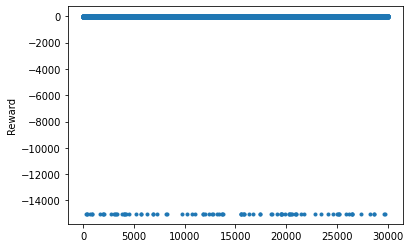

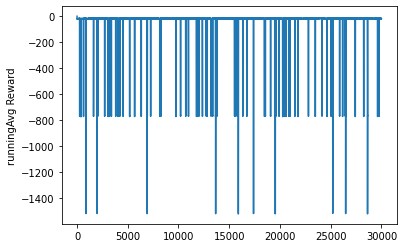

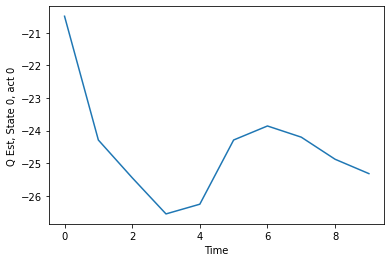

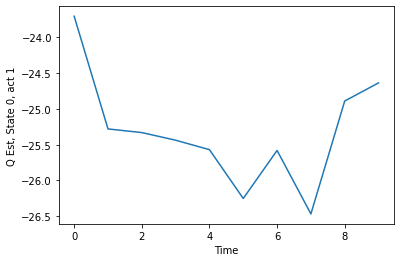

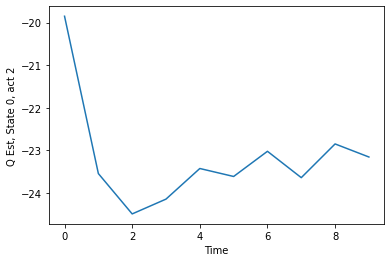

...

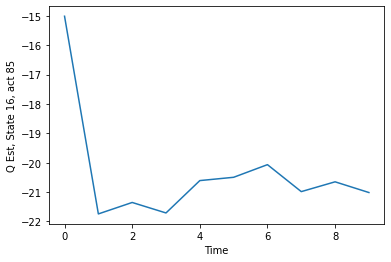

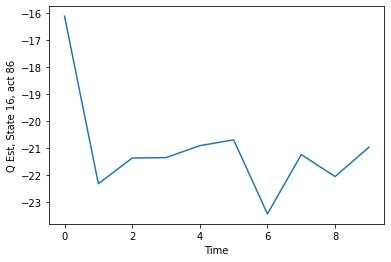

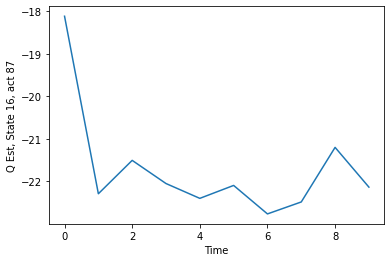

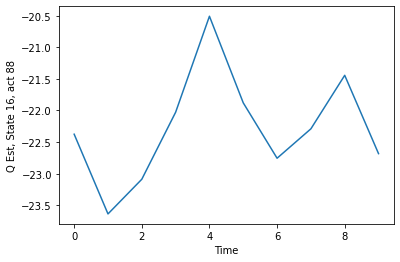

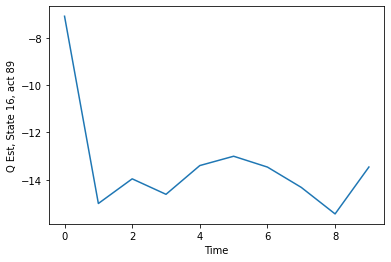

In [ ]:
obj2 = RLalgo2()
obj2.run_algo()

### Plot

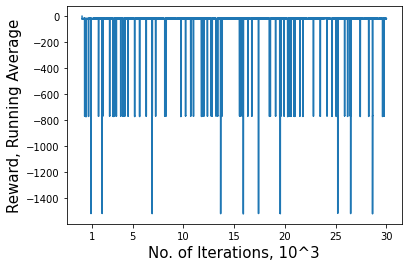

In [ ]:
plt.plot(obj2.runningAvg)
plt.ylabel('Reward, Running Average',fontsize=15)#, '35', '40', '45', '50', '55', '60'
plt.xlabel('No. of Iterations, 10^3',fontsize=15)#, 35000, 40000, 45000, 50000, 55000, 60000
plt.xticks([1000, 5000, 10000, 15000, 20000, 25000, 30000],['1', '5', '10', '15', '20', '25', '30'])
plt.show()

### Online

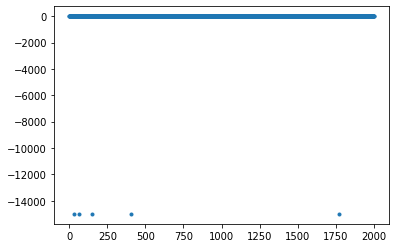

avg reward across time -42.6323256034008


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

mean NS reward -7.236303178727334
 mean NS migration -3.11268569712604
 mean NS delay -4.110374456934897
 mean NS storage -0.01324302466639709


<Figure size 432x288 with 0 Axes>

mean RE reward -3284.6457869447895
 mean RE migration -3.1166032966412636
 mean RE delay -4.800377180094786
 mean RE storage 0


In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Tue Aug  9 18:06:18 2022

@author: Marie
"""
from scipy.special import softmax


# no eligibility traces

import numpy as np
import itertools

import random
import matplotlib.pyplot as plt
from sklearn.preprocessing import normalize
from statistics import mean

#np.random.seed(4)
#random.seed(3)

# Q_ourAlgo =np.load('Q_ourAlgo.npy')
# Q_BL1= np.load('Q_BL1_c.npy')
Q_ourAlgo = obj2.QEst[:, :, TRIALS-1]
policy0=Q_ourAlgo#Q_BL1

NEGATIVE_REWARD = -15000
totalTS=50000
gamma=0.85 #discount factor
# alpha=0.05 # learning rate
# #deltaAlpha=0.0001 #adjustment rate for alpha
# alphaT=0.05
# alphaU=0.05

actualEPS=0.01

delta=0.005 # bounds for estimate epsilon.
lambda_=0.7 #eligibility decay rate
eps=0.9 #exploration rate
K=20

numAP=9
#numAnomalyAP=1
numActions=numAP*(1+numAP)
APlist=list(range(0,numAP))
#create dictionary of states
StatesDict=list(itertools.product(APlist,APlist))

numStates=(numAP)*(numAP)*2*(1+numAP)
noBackup=100
StatesDict=list(itertools.product(APlist,APlist))
actions = list(range( NUM_ACCESS_POINTS))
actions.append(NO_BACKUP)
somelists = [
  list(range( numAP)),#[0,1, 2],
  list(range( numAP)),#[0,1,2],
  [0,1],
  actions#[0,self.noBackup] # 'n' refers to no backup.
]

DIAG_DIRECTORY = 'diags/'
rsList=[]

stateList0=np.zeros((numStates,4))
a=0
for element in itertools.product(*somelists):

    #elem=np.array(element)
    #print(elem)
    stateList0[a,:]=element
    if stateList0[a,2]==1:
        rsList.append(a)
    a=a+1
#stateList=stateList0

backup0=101

actlists = [
    list(range( numAP)),
    actions
]
actList0=np.zeros((numActions,2))
# actList2=np.zeros((numAP*2,2)) # list of actions if there's currently no backup in system

a=0
b=0
for element in itertools.product(*actlists):
    actList0[a,:]=element
    # if actList0[a,1]!=remain:
    #     actList2[b,:]=actList0[a,:]
    #     b=b+1
    a=a+1
    
policy=np.zeros((numStates,numActions))
for n in range(0,numStates):
    policy[n,:]=softmax(policy0[n,:])
    


#edit this later. should be a function of number of BS.
numAnomalyStates=numAP*numAP #EDIT this later.
numNormalStates=numStates-numAnomalyStates

# # ENVIRONMENT
# # g(s'|s): transition prob from all states to anomaly
# g_ss=np.random.rand(numAP,numAnomalyAP) # l_svc stays the same.
# #sum_of_rows = g_ss.sum(axis=1)
# #g_dist=g_ss / sum_of_rows[:, np.newaxis]
# g_dist=normalize(g_ss,axis=1, norm='l1')

#lu_trans=np.random.rand(numAP,numAP-numAnomalyAP)  
#pr_lu_trans=normalize(lu_trans,axis=1, norm='l1')
# pr_lu_trans=np.array([[0.5,0.5,0], [0.15,0.1,0.75], [0.2,0.4,0.4]])
pr_lu_trans=np.array([
    [0.15,0.05,0.1,0.1,0.08,0.12,0.09,0.11,0.2],
    [0.1,0.08,0.12,0.09,0.11,0.03,0.17,0.15,0.15],
    [0.15,0.11,0.03,0.17,0.05,0.1,0.1,0.08,0.21],
    [0.15,0.05,0.1,0.1,0.11,0.03,0.17,0.08,0.21],
    [0.15,0.05,0.1,0.1,0.08,0.12,0.17,0.09,0.14],
    [0.12,0.09,0.15,0.05,0.1,0.1,0.08,0.11,0.2],
    [0.05,0.1,0.1,0.08,0.12,0.15,0.09,0.11,0.2],
    [0.09,0.11,0.03,0.15,0.05,0.1,0.1,0.08,0.29],
    [0.08,0.15,0.05,0.1,0.1,0.12,0.09,0.11,0.2]])


#ValueEst=np.zeros((totalNStates,totalTS+1))
# QEst=np.zeros((numStates,numActions, totalTS+1))
# QEst[:,:,0]=random.random()*np.ones((numStates,numActions))
#note, we are initialising all to be the same

# anomalySamplingDist=np.zeros((numStates,totalTS+1))
# anomalySamplingDist[:,0]=0.5
#actualEps=delta*np.ones((totalNStates))
actualEps=actualEPS*np.ones((numStates))

# U_normal=np.zeros((numStates,totalTS+1))
# T_anomaly=np.zeros((numStates,totalTS+1))
# eligibility=np.zeros((numStates,numActions,totalTS+1))


#pi(s,a)
#policy=np.random.rand(numStates,numActions)

# reward function:
#migrationCost=10*np.random.rand(numAP,numAP)
LATENCY_MATRIX = [[2.55316, 9.70525, 7.02418, 2.50611, 8.97695, 4.81203, 6.93397, 6.21317, 7.60077],
                  [9.70525, 2.55389, 6.25835, 11.8198, 7.18656, 3.92144, 6.99266, 6.2124, 6.71018],
                  [7.02418, 6.26684, 2.55398, 4.02147, 3.27882, 2.77404, 4.02353, 5.07656, 2.77417],
                  [2.50611, 11.8198, 4.02147, 2.55354, 9.28922, 7.44114, 9.19819, 4.21866, 11.8622],
                  [8.97695, 7.18656, 3.27882, 9.28922, 2.55301, 3.26512, 2.0394, 5.5403, 5.58373],
                  [4.75385, 3.92267, 2.77457, 7.44114, 3.26512, 2.55366, 1.58549, 3.0197, 2.78874],
                  [6.91204, 7.6288, 4.2441, 9.19819, 2.0394, 1.58474, 2.55359, 3.95576, 4.37348],
                  [6.21317, 6.2124, 5.31069, 4.21866, 6.59593, 3.06604, 3.95576, 2.55396, 5.85478],
                  [7.60077, 6.71018, 2.77417, 11.8622, 5.55827, 2.78874, 4.37348, 5.85478, 2.55313]]
MIGR_COST = np.zeros((numAP, numAP))
STORAGE_COST_temp = np.zeros((numAP))
for p in range(numAP):
  diff = random.uniform(-0.5, 0.5)
  STORAGE_COST_temp[p] = 5+diff
  for q in range(numAP):
    diff = random.uniform(-0.5, 0.5)
    MIGR_COST[p][q] = LATENCY_MATRIX[p][q]+diff


commDelay=LATENCY_MATRIX#np.array([[2.55316,9.70525, 7.02418], [9.70525, 2.55389,6.25835], [7.02418,6.26684,2.55398]])
migrationCost=MIGR_COST#np.zeros((numAP,numAP))
# for b in range(numAP):
#     for c in range(numAP):
        
#         diff=random.uniform(-0.5,0.5)
#         migrationCost[b,c]=commDelay[b,c]+diff
#         if b==c:
#             migrationCost[b,c]=0
        
#commDelay=0.5*commDelay
#migrationCost=0.5*migrationCost
userAccFactor=1.5
#the further the dist btwn the two AP, the higher the migration cost
# and the higher the comm delay

storageCost=5*np.ones((numAP)) #5*np.random.rand(numAP)

Reward=np.zeros((totalTS))
runningAvg=np.zeros((totalTS))

# initial state
state=random.randrange(0,numStates)
prevSvcLoc=stateList0[state][1]
#action=random.randint(0,numActions-1)
action=np.random.choice(np.arange(0,numActions), 1, replace=False, p=policy[state,:])[0]
Action=np.zeros((totalTS+1))
Action[0]=action #initialising
storCost=0
backupLoc=noBackup
if actList0[action][1]!=noBackup:
    backupLoc=int(actList0[action][1])
    storCost=storageCost[backupLoc]
newSvcLoc=actList0[action][0]
prev_backup_loc = noBackup

# TDerror=np.zeros((totalTS))
# importanceWeight=np.zeros((numStates,totalTS))
countT=np.zeros((numStates))
countNotT=np.zeros((numStates))

countState=np.zeros((numStates))
whichState=np.zeros((totalTS))

# est11=np.zeros((totalTS))

# AStar_tracker=np.zeros((totalTS))

REreward=[]
REmigration=[]
REdelay=[]
REstorage=[]

NSreward=[]
NSmigration=[]
NSdelay=[]
NSstorage=[]

for t in range(0,totalTS):
    
    # if t>30000:
    #     alpha=max(alpha-0.00005,0.005)
    #     alphaT=alpha
    #     alphaU=alpha
    whichState[t]=state
    countState[state]+=1
    prevUserLoc=int(stateList0[state][0])
    prevSvcLoc=int(stateList0[state][1])
    

    # c) go through environment.
    newUserLoc=np.random.choice(np.arange(0,numAP), 1, replace=False, p=pr_lu_trans[prevUserLoc,:])[0]

    
    #eligibility[state,action,t]=eligibility[state,action,t]+1
    
    
    #if random number is smaller than the sampling prob, rare event has occured
    if random.random()< actualEps[state]: #anomalySamplingDist[state,t]:
        failureLoc= actList0[action][0]
        # check if there is backup
        backup_migration_cost = 0
        if backupLoc==noBackup:
            Reward[t]=NEGATIVE_REWARD-migrationCost[prevSvcLoc,int(newSvcLoc)]
            REstorage.append(0)
        else:
            #Reward[t]=-2000
            #Reward[t]=-userAccFactor*migrationCost[newUserLoc,backupLoc]-storCost
            if prev_backup_loc != noBackup and backupLoc!=noBackup and prev_backup_loc != backupLoc:#second condition is true for else block
                backup_migration_cost = migrationCost[prev_backup_loc,backupLoc]
            if backupLoc==failureLoc: # we dont want this to happen.
                Reward[t]= NEGATIVE_REWARD-migrationCost[prevSvcLoc,int(newSvcLoc)]-storCost-backup_migration_cost
                REstorage.append(-storCost)
            else:
                Reward[t]=-commDelay[newUserLoc][backupLoc]-migrationCost[prevSvcLoc][int(newSvcLoc)]-storCost-backup_migration_cost
                REstorage.append(-storCost)
                dela=-commDelay[newUserLoc][backupLoc]
                REdelay.append(dela)
        REreward.append(Reward[t])
        migr=-migrationCost[prevSvcLoc][int(newSvcLoc)]-backup_migration_cost
        REmigration.append(migr)
        
        
        stateName=np.array([newUserLoc,int(newSvcLoc),1,backupLoc])
        nextState=np.where(np.all(stateList0==stateName,axis=1))[0][0]

        # #d) compute importance sampling weight.
        # #if StatesDict[nextState] in AnomalyDict:
        # importanceWeight[state,t]=actualEps[state]/anomalySamplingDist[state,t]
        # #print('importance',importanceWeight[state])
        countT[state]+=1
        
        
        
    else: # no rare event has occured.
        backup_migration_cost = 0
        if prev_backup_loc != noBackup and backupLoc!=noBackup and prev_backup_loc != backupLoc:#second condition is true for else block
            backup_migration_cost = migrationCost[prev_backup_loc][backupLoc]
        MigrationCost=migrationCost[prevSvcLoc][int(newSvcLoc)]+backup_migration_cost
        #print(MigrationCost)
        #userLoc= stateList[state][0]
        # print("new user loc: ", newUserLoc, "+++++++++++++++++++++")
        # print("new serv loc: ", newSvcLoc, "+++++++++++++++++++++")
        CommDelayCost=commDelay[newUserLoc][int(newSvcLoc)]
        #print(CommDelayCost, newUserLoc,int(newSvcLoc) )
        
        Reward[t]=(-MigrationCost-CommDelayCost)-storCost
        NSreward.append(Reward[t])
        NSmigration.append(-MigrationCost)
        NSdelay.append(-CommDelayCost)
        #print(-MigrationCost,-CommDelayCost)
        NSstorage.append(-storCost)
        
        stateName=np.array([newUserLoc,int(newSvcLoc),0,backupLoc])
    
        
        nextState=np.where(np.all(stateList0==stateName,axis=1))[0][0]
    
        # # d) compute importance sampling weight.
        # importanceWeight[state,t]=(1-actualEps[state])/(1-anomalySamplingDist[state,t])
        # #print('importance',importanceWeight[state])
        # countNotT[state]+=1
        
        
    # select action based on s^(t+1)
    #if t>30000:
     #   eps=max(eps-0.00005,0.01)
    
    # if random.random() < eps:
    #     actionNew =random.randint(0, numActions-1)
    # else:        
    #     actionNew=np.argmax(QEst[nextState,:,t])
    #actionNew=np.argmax(policy[nextState,:])
    prev_backup_loc = backupLoc
    actionNew=np.random.choice(np.arange(0,numActions), 1, replace=False, p=policy[nextState,:])[0]
    
    # ****************************************************************************************************CHANGEDDDDDDDDDDDD

    storCost=0
    # if actList0[action][1]!=noBackup:
    #     backupLoc=int(actList0[action][1])
    #     storCost=storageCost[backupLoc]
    if actList0[actionNew][1]!=noBackup:
        backupLoc=int(actList0[actionNew][1])
        storCost=storageCost[backupLoc]

    newSvcLoc=actList0[actionNew][0]
    Action[t+1]=actionNew
    # aStar=np.argmax(QEst[nextState,:,t])
    # AStar_tracker[t]=aStar
    # if QEst[nextState,aStar,t]==QEst[nextState,actionNew,t]:
    #     aStar=actionNew
    #     AStar_tracker[t]=aStar
    
    
    # # e) compute imp sampling TD-error
    # TDerror[t]=importanceWeight[state,t]*(Reward[t] +gamma*QEst[nextState,aStar,t])-QEst[state,action,t]

    
    # for s in range(0,numStates):
        
    #     for a in range(0,numActions):
    #         QEst[s,a,t+1]=QEst[s,a,t]
            
    #     T_anomaly[s,t+1]=T_anomaly[s,t]
    #     U_normal[s,t+1]=U_normal[s,t]
    # QEst[state,action,t+1]=QEst[state,action,t]+alpha*TDerror[t]
    # #print(QEst[state,action,t+1],QEst[state,action,t])
    
    # # g) update T and U.
    # if nextState in rsList:
    #     #alphaT=1/countT[state]*1.1
    #     #alphaT= max(alphaT-deltaT,0.15) 
    #     T_anomaly[state,t+1]=(1-alphaT)*T_anomaly[state,t]+alphaT*actualEps[state]*(Reward[t] +gamma*QEst[nextState,aStar,t+1])
    #     #print('for T', Reward[t] +gamma*QEst[nextState,aStar,t+1],QEst[nextState,aStar,t+1])
    #     #T_anomaly[state,t+1]=(1-alphaT)*T_anomaly[state,t]+alphaT*anomalySamplingDist[state,t]*(Reward[t] +gamma*QEst[nextState,aStar,t+1])
        
    #     #print('Told', (1-alphaT)*T_anomaly[state])
    #     #print('Tnew',alphaT*eligibility[state]*(Reward[t] +gamma*ValueEst[nextState,t+1]))
    # else:
    #     #alphaU= max(alphaU-deltaU,0.15)
    #     U_normal[state,t+1]=(1-alphaU)*U_normal[state,t]+alphaU*(1-actualEps[state])*(Reward[t] +gamma*QEst[nextState,aStar,t+1])
    #     #print('for U', Reward[t] +gamma*QEst[nextState,aStar,t+1], QEst[nextState,aStar,t+1])
    #     #U_normal[state,t+1]=(1-alphaU)*U_normal[state,t]+alphaU*(1-anomalySamplingDist[state,t])*(Reward[t] +gamma*QEst[nextState,aStar,t+1])
        
    #     #print('U new',alphaU*(1-eligibility[state])*(Reward[t] +gamma*ValueEst[nextState,t+1]))
    # # h) update rare event probs
    # #print('T', T_anomaly[state,t+1], 'U',U_normal[state,t+1] )
    # est1=abs(T_anomaly[state,t+1])/(abs(T_anomaly[state,t+1])+abs(U_normal[state,t+1]))
    # #print('t', abs(T_anomaly[state,t+1]))
    # #print('u',abs(U_normal[state,t+1]))
    # est11[t]=est1
    # for s in range(0,numStates):
    #     anomalySamplingDist[s,t+1]=anomalySamplingDist[s,t]
    # anomalySamplingDist[state,t+1]=min(max(delta,est1),1-delta)
   

    
    action=actionNew
    state=nextState
    
    if t>=1:
        if t<K:
            #print(Reward[K-1:K])
            runningAvg[t]=np.average(Reward[0:t])
        else:
            runningAvg[t]=np.average(Reward[t-K:t])

plt.plot(Reward[0:2000],'.')
plt.show()

print('avg reward across time', np.mean(Reward))


plt.plot(runningAvg)
plt.ylabel('Reward, Running Average')
plt.xlabel('No. of Iterations, x10^3')
#plt.xlabel('Price Pr, Po={}, Qo={}'.format(Po,qo))   
nameR=DIAG_DIRECTORY + 'QRewardConvg_lr'
plt.xticks([25000,50000,75000, 100000,125000,150000,175000,200000], ['25', '50', '75','100','125','150','175','200'])#,
# plt.savefig(nameR, bbox_inches="tight")
plt.clf()
plt.show()


plt.plot(NSreward)
plt.ylabel('Normal States')
nameR=DIAG_DIRECTORY + 'Norm_St'
# plt.savefig(nameR)
plt.clf()
plt.show()

print('mean NS reward', mean(NSreward))
print(' mean NS migration', mean(NSmigration))
print(' mean NS delay', mean(NSdelay))
print(' mean NS storage', mean(NSstorage))


plt.plot(REreward)
plt.ylabel('Rare Events States')
nameR=DIAG_DIRECTORY + 'Rare_ev_st'
# plt.savefig(nameR)
plt.clf()
plt.show()

print('mean RE reward', mean(REreward))
print(' mean RE migration', mean(REmigration))
print(' mean RE delay', mean(REdelay))
print(' mean RE storage', mean(REstorage))



